## DATA ANALYSIS LAB - PROJECT 5 (Application flow identification)

## Imports

In [ ]:
!pip install imbalanced-learn > /dev/null

import os
import time
import pickle
import random
import warnings
import hyperopt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from imblearn.over_sampling import RandomOverSampler, SMOTE, BorderlineSMOTE, ADASYN
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
warnings.filterwarnings("ignore")

## **PART 1 - Raw data visualization**

In [ ]:
# Import csv file and read the dataset
!wget -q -O 22_apps_flow_features.csv 'https://drive.google.com/uc?export=download&id=1LPlOEROVHT4xQQluhG0Vx7eoD8lwlGz1'
df = pd.read_csv('22_apps_flow_features.csv')

# Drop not meaningful columns
columns_to_delete = ['Flow.ID', 'Source.IP', 'Source.Port', 'Destination.IP', 'Destination.Port', 'Protocol', 'Timestamp', 'Label']
df = df.drop(columns_to_delete, axis=1)

print('Shape before removing NULL values {}'.format(df.shape))
a = df.columns

Shape before removing NULL values (17400, 79)


In [ ]:
# Remove the rows that contains NULL values
df.dropna(inplace=True)
df.dropna(axis='columns')

# Remove columns which contains all zeroes in the data
df = df.loc[:, (df != 0).any(axis=0)]

print('Shape after removing NULL values {}'.format(df.shape))

Shape after removing NULL values (17400, 69)


In [ ]:
# Display removed columns
b = df.columns
difference = list(set(a) - set(b))
print('Removed zero-columns:\n')
display(difference)

Removed zero-columns:



['Fwd.Avg.Bytes.Bulk',
 'Fwd.Avg.Packets.Bulk',
 'Bwd.Avg.Bytes.Bulk',
 'Fwd.Avg.Bulk.Rate',
 'Bwd.Avg.Packets.Bulk',
 'Fwd.URG.Flags',
 'Bwd.URG.Flags',
 'Bwd.Avg.Bulk.Rate',
 'CWE.Flag.Count',
 'Bwd.PSH.Flags']

In [ ]:
# Show the number of different application flows
apps = list(df['ProtocolName'].unique())

print('Number of different applications is '+str(len(apps)))
print(apps)

Number of different applications is 22
['HTTP', 'GOOGLE', 'YOUTUBE', 'DROPBOX', 'WINDOWS_UPDATE', 'TOR', 'GMAIL', 'SKYPE', 'MS_ONE_DRIVE', 'APPLE_ICLOUD', 'OFFICE_365', 'DNS', 'WHATSAPP', 'FTP_DATA', 'MQTT', 'INSTAGRAM', 'GOOGLE_MAPS', 'NTP', 'TEAMVIEWER', 'SPOTIFY', 'NETFLIX', 'SSH']


In [ ]:
app_counts = df['ProtocolName'].value_counts()    # Count the number of rows with a specific application
max_samples = app_counts.max()    # Find the max number of samples for an application
print('The max number of samples linked to an app is {}'.format(max_samples))

labels = ['L7Protocol', 'ProtocolName']

# Separate features (X) and target variable (y)
X = df.drop(labels, axis=1)
y = df['ProtocolName']

The max number of samples linked to an app is 1000


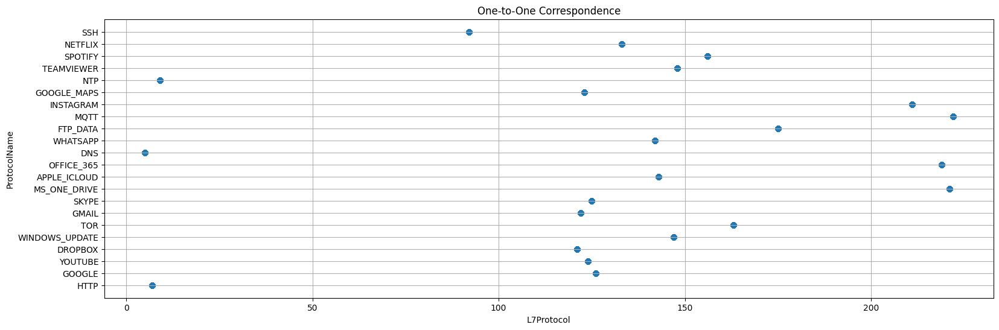



To every ProtocolName corresponde only one value of L7Protocol, hence there is a one-to-one correspondence


In [ ]:
# Plotting the one-to-one correspondence
plt.figure(figsize=(19, 6))
plt.scatter(df['L7Protocol'], df['ProtocolName'])
plt.xlabel('L7Protocol')
plt.ylabel('ProtocolName')
plt.title('One-to-One Correspondence')
plt.grid()

# Create a result folder
res_folder = 'Results'
if not os.path.exists(res_folder):
        os.makedirs(res_folder)
plt.savefig(res_folder+'/Correspondence.png')
plt.show()

print('\n\nTo every ProtocolName corresponde only one value of L7Protocol, hence there is a one-to-one correspondence')

In [ ]:
to_augment = []

# Access the count for a specific application
for app in apps:
    app_count = app_counts[app]
    # print('{} samples of app {} present in the dataframe'.format(app_count, app))

    if app_count < max_samples:
        to_augment.append(app)

print('\nThe applications to add samples to are {}'.format(to_augment))


The applications to add samples to are ['TOR', 'FTP_DATA', 'MQTT', 'GOOGLE_MAPS', 'NTP', 'TEAMVIEWER', 'SSH']


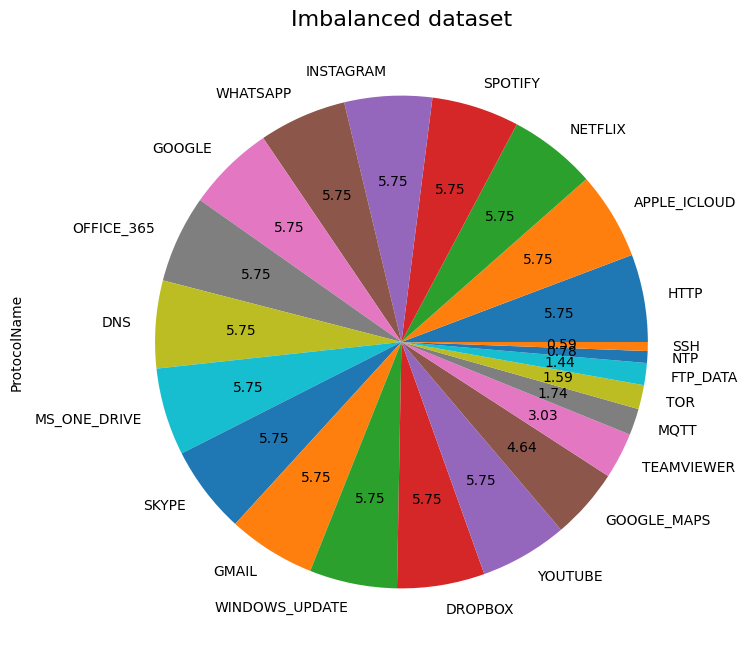

In [ ]:
# Create the pie chart to visualize the unbalance
fig, ax = plt.subplots(figsize=(8, 8))
y.value_counts().plot.pie(autopct='%.2f', pctdistance=.65, labeldistance=1.1, ax=ax)
plt.ylabel('ProtocolName', labelpad=50)
ax.set_title('Imbalanced dataset', fontsize=16)

plt.savefig(res_folder+'/Imbalanced_dataset.png')
plt.show()

## **P.S.**: This cell is related to the Advaced Topic, and so it must be executed only for the purpose of computing metrics considering only the most important features for each method used.

In [ ]:
# 10 BEST IMPORTANT FEATURES FOR EACH METHOD

columns_imbalanced = ['Bwd.Packet.Length.Min', 'Init_Win_bytes_backward', 'Init_Win_bytes_forward', 'Flow.Duration', 'Fwd.Packet.Length.Max', 'Idle.Min', 'Fwd.Packet.Length.Std', 'Bwd.IAT.Total', 'Min.Packet.Length', 'Avg.Fwd.Segment.Size']
columns_random_oversampling = ['Bwd.Packet.Length.Min', 'Init_Win_bytes_backward', 'Init_Win_bytes_forward', 'Idle.Min', 'Fwd.Packet.Length.Max', 'Min.Packet.Length', 'Fwd.IAT.Std', 'Idle.Max', 'Fwd.Packet.Length.Std', 'Flow.Duration']
columns_smote_oversampling = ['Bwd.Packet.Length.Min', 'Init_Win_bytes_backward', 'Fwd.Packet.Length.Max', 'Init_Win_bytes_forward', 'Min.Packet.Length', 'Idle.Min', 'Flow.Duration', 'Idle.Max', 'Idle.Min', 'Avg.Fwd.Segment.Size']
columns_bsmote_oversampling = ['Bwd.Packet.Length.Min', 'Init_Win_bytes_backward', 'Init_Win_bytes_forward', 'Idle.Min', 'Idle.Mean', 'Idle.Max', 'Fwd.Packet.Length.Max', 'Flow.Duration', 'Fwd.Packet.Length.Min', 'Min.Packet.Length']
columns_adasyn_oversampling = ['Idle.Max', 'Fwd.Packet.Length.Max', 'Init_Win_bytes_backward', 'Fwd.Packet.Length.Min', 'Idle.Min', 'Flow.IAT.Mean', 'Max.Packet.Length', 'Flow.IAT.Max', 'Init_Win_bytes_forward', 'Active.Mean']


# FOR EACH LIST REPEAT THE PROCEDURE TO SEE IF METRICS CHANGES

print('Possible Methods: \n1) Imbalanced\n2) Random\n3) SMOTE\n4) BSMOTE\n5) ADASYN')
select = input('Select the method (insert corresponding number): ')

match select:
  case '1':
        important_features = columns_imbalanced
  case '2':
        important_features = columns_random_oversampling
  case '3':
        important_features = columns_smote_oversampling
  case '4':
        important_features = columns_bsmote_oversampling
  case '5':
        important_features = columns_adasyn_oversampling
  case _:
      pass

labels = ['L7Protocol', 'ProtocolName']

# Separate features (X) and target variable (y)
X = df.drop(labels, axis=1)
X = X[important_features]
y = df['ProtocolName']

Possible Methods: 
1) Imbalanced
2) Random
3) SMOTE
4) BSMOTE
5) ADASYN
Select the method (insert corresponding number): 5


## **PART 2 - Data preprocessing**
Augmentation:
* Simple oversampling
* SMOTE
* BorderlineSMOTE
* ADASYN

In [ ]:
# Check if the number of samples of every application is equal to the max_samples
# value after over-sampling both in L7Protocol and ProtocolName fields

def correct_oversample(y, max_samples):
    # Count the number of rows with a specific label
    y_counts = y.value_counts()

    if (y_counts == max_samples).all():
        print('\nAll applications have {} samples\n'.format(max_samples))
        return 0

    else:
        print('\nNot all applications have {} samples:'.format(max_samples))
        unbal_label = y_counts[y_counts != max_samples]  # Check the unbalanced label
        print(unbal_label)
        return 1

In [ ]:
# Random over-sampling of the dataset
ros = RandomOverSampler(sampling_strategy='not majority')

# Apply the same random over-sampling
X_rand, y_rand = ros.fit_resample(X, y)

# Check if the over-sampling is correct
check = correct_oversample(y_rand, max_samples)
if check == 0:
    # Combine the balanced features and labels into a new dataframe
    df_rand = pd.DataFrame(X_rand, columns=X.columns)
    df_rand['ProtocolName'] = y_rand


All applications have 1000 samples



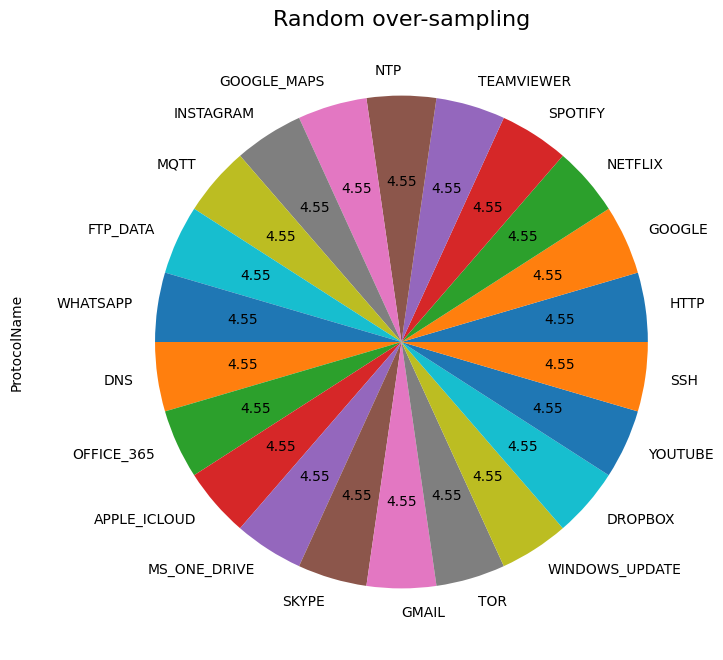

In [ ]:
# Create the pie chart to visualize the balance
fig, ax = plt.subplots(figsize=(8, 8))
y_rand.value_counts().plot.pie(autopct='%.2f', pctdistance=.65, labeldistance=1.1, ax=ax)
plt.ylabel('ProtocolName', labelpad=50)
#plt.ylabel('')
ax.set_title('Random over-sampling',  fontsize=16)

plt.savefig(res_folder+'/Random_Oversampling_dataset.png')
plt.show()

In [ ]:
# Apply SMOTE oversampling technique
smote = SMOTE(sampling_strategy='not majority', k_neighbors=5)

X_smote, y_smote = smote.fit_resample(X, y)

# Check if the over-sampling is correct
check = correct_oversample(y_smote, max_samples)
if check == 0:
    # Combine the balanced features and labels into a new dataframe
    df_smote = pd.DataFrame(X_smote, columns=X.columns)
    df_smote['ProtocolName'] = y_smote


All applications have 1000 samples



In [ ]:
# Apply Bordeline-SMOTE oversampling technique
b_smote = BorderlineSMOTE(sampling_strategy='not majority', k_neighbors=5)

X_bsmote, y_bsmote = b_smote.fit_resample(X, y)

# Check if the over-sampling is correct
check = correct_oversample(y_bsmote, max_samples)
if check == 0:
    # Combine the balanced features and labels into a new dataframe
    df_bsmote = pd.DataFrame(X_bsmote, columns=X.columns)
    df_bsmote['ProtocolName'] = y_bsmote


All applications have 1000 samples



In [ ]:
# ADASYN doesn't guarantee a perfectly balanced oversampled dataframe. The generated synthetic
# samples are proportional to the density of minority class instances, this can result in a slightly imbalanced dataset.
# The aim of the function is to find the best value of neighbors that leads to a more balanced dataframe.

def find_best_n(max_samples, X, y, trials):
    def s_correct_oversample(y, max_samples):
        return int((y.value_counts() != max_samples).any())

    # Percentage of distibution with a balanced dataframe
    perc_bal = 1/len(apps)
    min_sum = float('inf')

    for j in range(1, trials):
        check = s_correct_oversample(y, max_samples)
        X_s = X
        y_s = y

        try:
            while check == 1:

                # Apply ADASYN oversampling technique
                adasyn = ADASYN(sampling_strategy='minority', n_neighbors=j)
                X_adasyn, y_adasyn = adasyn.fit_resample(X_s, y_s)

                # Check if the over-sampling is correct
                check = s_correct_oversample(y_adasyn, max_samples)

                # Combine the balanced features and labels into a new dataframe
                df_adasyn = pd.DataFrame(X_adasyn, columns=X.columns)
                df_adasyn['ProtocolName'] = y_adasyn

                X_s = df_adasyn.drop('ProtocolName', axis=1)
                y_s = df_adasyn['ProtocolName']

        except ValueError as ve:
            df_adasyn = pd.DataFrame(X_adasyn, columns=X.columns)
            df_adasyn['ProtocolName'] = y_adasyn

        except RuntimeError as re:
            df_adasyn = pd.DataFrame(X_adasyn, columns=X.columns)
            df_adasyn['ProtocolName'] = y_adasyn

        sum_diff = abs(df_adasyn['ProtocolName'].value_counts(normalize=True) - perc_bal).sum()

        # Save value of neighbours that gives the best balance in the dataframe
        if sum_diff < min_sum:
            min_sum = sum_diff
            best_n_neigh = j

    return best_n_neigh

In [ ]:
print('***************************Initial State***************************\n')

check = correct_oversample(y, max_samples)
best_n = find_best_n(max_samples, X, y, 31)
print(f'\nBest number of neighbors for ADASYN: {best_n}')
X_s = X
y_s = y

print('\n\n**********************Starting the while loop**********************\n')

i = 0

try:
    while check == 1:
        # Apply ADASYN oversampling technique
        adasyn = ADASYN(sampling_strategy='minority', n_neighbors=best_n)

        X_adasyn, y_adasyn = adasyn.fit_resample(X_s, y_s)

        i += 1
        print(f'Iteration: {i}')

        # Check if the over-sampling is correct
        check = correct_oversample(y_adasyn, max_samples)

        # Combine the balanced features and labels into a new dataframe
        df_adasyn = pd.DataFrame(X_adasyn, columns=X.columns)
        df_adasyn['ProtocolName'] = y_adasyn

        X_s = df_adasyn.drop('ProtocolName', axis=1)
        y_s = df_adasyn['ProtocolName']

        print('\n\n')

except ValueError as ve:
    # Combine the balanced features and labels into a new dataframe
    df_adasyn = pd.DataFrame(X_adasyn, columns=X.columns)
    df_adasyn['ProtocolName'] = y_adasyn

    print('Rows of the dataframe: ', df_adasyn.shape[0])
    print('Correct rows of the dataframe: ', 22*1000)

***************************Initial State***************************


Not all applications have 1000 samples:
GOOGLE_MAPS    807
TEAMVIEWER     527
MQTT           302
TOR            276
FTP_DATA       251
NTP            135
SSH            102
Name: ProtocolName, dtype: int64

Best number of neighbors for ADASYN: 17


**********************Starting the while loop**********************

Iteration: 1

Not all applications have 1000 samples:
SSH            991
GOOGLE_MAPS    807
TEAMVIEWER     527
MQTT           302
TOR            276
FTP_DATA       251
NTP            135
Name: ProtocolName, dtype: int64



Iteration: 2

Not all applications have 1000 samples:
NTP            996
SSH            991
GOOGLE_MAPS    807
TEAMVIEWER     527
MQTT           302
TOR            276
FTP_DATA       251
Name: ProtocolName, dtype: int64



Iteration: 3

Not all applications have 1000 samples:
NTP            996
SSH            991
GOOGLE_MAPS    807
TEAMVIEWER     527
MQTT           302
TOR            27

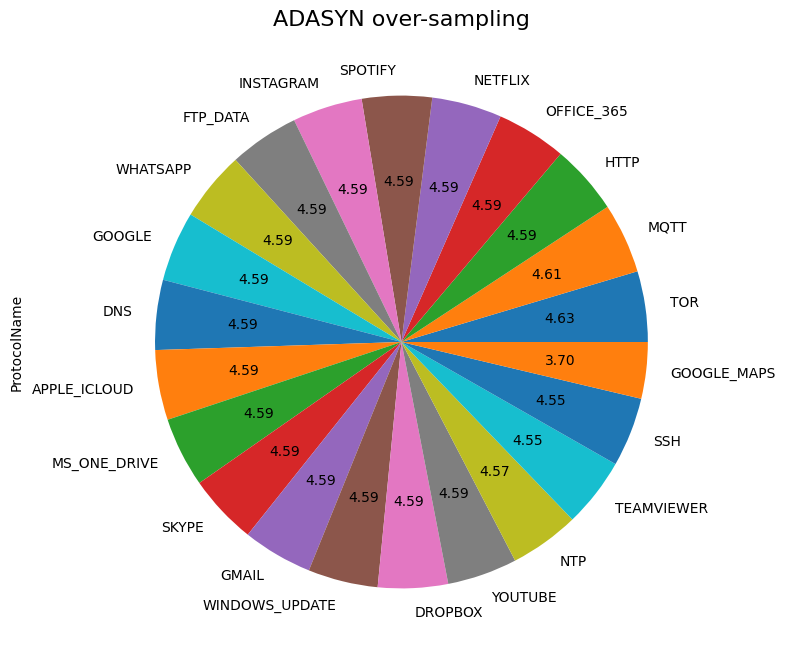

In [ ]:
# Create the pie chart to visualize the balance
fig, ax = plt.subplots(figsize=(8, 8))
y_adasyn.value_counts().plot.pie(autopct='%.2f', pctdistance=.65, labeldistance=1.1, ax=ax)
plt.ylabel('ProtocolName', labelpad=50)
#plt.ylabel('')
ax.set_title('ADASYN over-sampling',  fontsize=16)

plt.savefig(res_folder+'/ADASYN_Oversampling_dataset.png')
plt.show()

## **PART 3 - ML models optimization and training**
Hyperparameters tuning with cross-validation

* Random Forest
* K-Nearest Neighbors

In [ ]:
def optimize_RandomForest(dataframe):
    y = dataframe['ProtocolName']
    X = dataframe.drop('ProtocolName', axis=1)

    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Search space for your hyperparameters
    space4rf = {
     'estimators': hp.choice('estimators', [10, 50, 100]),
     'crit': hp.choice('crit', ['entropy', 'log_loss']),
     'maxd': hp.choice('maxd', [1, 10, 20]),
    }

    def hyperopt_train_test(params):
        model = RandomForestClassifier(n_estimators=params['estimators'], criterion=params['crit'],
                                       max_depth=params['maxd'], class_weight='balanced')

        return cross_val_score(model, X_train, y_train, cv = 5).mean()

    def f(params):
        acc = hyperopt_train_test(params)
        return {'loss': -acc, 'status': STATUS_OK} # loss is returned as opposite (negative) of accuracy because we will use in f_min (that only minimizes), where we want to minimize the loss (i.e., maximize accuracy)

    trials = Trials() # Object that keeps track of all trials (combination of hyperparameters) tested during the optimization

    ta = time.time()
    best_params = fmin(f, space4rf, algo=tpe.suggest, max_evals=10, trials=trials)
    # best_param is a dictionary where each key is the index of the corresponding best param in space4rf
    tb = time.time()
    print(best_params)

    best_params = hyperopt.space_eval(space4rf, best_params)
    # Extract from space4rf the best values according to the indexes in best_params
    print(best_params)

    best_cv_acc = -round(trials.best_trial['result']['loss'], 2) # Best across trials
    print('\nbest_cv_acc: ' + str(best_cv_acc))
    print('Crossvalidation duration for RF is {} s\n'.format(round(tb - ta)))

    # Train a new model using best hyperparameters and the entire training set
    rf = RandomForestClassifier(n_estimators=best_params['estimators'], criterion=best_params['crit'],
                                       max_depth=best_params['maxd'], class_weight='balanced')

    t0 = time.time()
    rf.fit(X_train, y_train)
    t1 = time.time()

    print('Best number of estimators: {}\n'.format(best_params['estimators']))
    print('Best splitting criterion: {}\n'.format(best_params['crit']))
    print('Best max_depth: {}\n'.format(best_params['maxd']))
    print('Crossvalidation accuracy: {}\n'.format(best_cv_acc))
    print('Training duration for RF is {} s\n'.format(round(t1 - t0)))

    return rf

In [ ]:
def save_rf(dataframe, name):
    print('Training RandomForest for {} dataframe...\n'.format(name))
    rf = optimize_RandomForest(dataframe)

    if not os.path.exists('Results/Models'):
        os.makedirs('Results/Models')

    rfmodelfile = 'Results/Models/RF_'+name+'.json'
    pickle.dump(rf, open(rfmodelfile, 'wb'))

In [ ]:
print('*********************************************************************************')
save_rf(df.drop(['L7Protocol'], axis=1), 'Imbalanced')

print('\n\n*********************************************************************************')
save_rf(df_rand, 'Random_oversampled')

print('\n\n*********************************************************************************')
save_rf(df_smote, 'SMOTE_oversampled')

print('\n\n*********************************************************************************')
save_rf(df_bsmote, 'BSMOTE_oversampled')

print('\n\n*********************************************************************************')
save_rf(df_adasyn, 'ADASYN_oversampled')

*********************************************************************************
Training RandomForest for Imbalanced dataframe...

100%|██████████| 10/10 [05:03<00:00, 30.32s/trial, best loss: -0.7903017241379311]
{'crit': 0, 'estimators': 2, 'maxd': 2}
{'crit': 'entropy', 'estimators': 100, 'maxd': 20}

best_cv_acc: 0.79
Crossvalidation duration for RF is 303 s

Best number of estimators: 100

Best splitting criterion: entropy

Best max_depth: 20

Crossvalidation accuracy: 0.79

Training duration for RF is 18 s



*********************************************************************************
Training RandomForest for Random_oversampled dataframe...

100%|██████████| 10/10 [04:23<00:00, 26.37s/trial, best loss: -0.8469318181818182]
{'crit': 0, 'estimators': 2, 'maxd': 2}
{'crit': 'entropy', 'estimators': 100, 'maxd': 20}

best_cv_acc: 0.85
Crossvalidation duration for RF is 264 s

Best number of estimators: 100

Best splitting criterion: entropy

Best max_depth: 20

Crossvalidatio

In [ ]:
def optimize_KNN(dataframe):

    y = dataframe['ProtocolName']
    X = dataframe.drop('ProtocolName', axis=1)

    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Search space for your hyperparameters
    space4knn = {
     'neighb': hp.choice('neighb', [10, 50, 100]),
     'wgts': hp.choice('wgts', ['uniform', 'distance']),
    }


    def hyperopt_train_test(params):
        model = KNeighborsClassifier(n_neighbors=params['neighb'], weights=params['wgts'])
        return cross_val_score(model, X_train, y_train, cv = 5).mean()


    def f(params):
        acc = hyperopt_train_test(params)
        return {'loss': -acc, 'status': STATUS_OK}

    trials = Trials()

    ta = time.time()
    best_params = fmin(f, space4knn, algo=tpe.suggest, max_evals=10, trials=trials)
    tb = time.time()
    print(best_params)

    best_params = hyperopt.space_eval(space4knn, best_params)
    print(best_params)

    best_cv_acc = -round(trials.best_trial['result']['loss'], 2) #F: best across trials
    print('\nbest_cv_acc: ' + str(best_cv_acc))
    print('Crossvalidation duration for KNN is {} s\n'.format(round(tb - ta)))

    # Train a new model using best hyperparameters and the entire training set
    knn = KNeighborsClassifier(n_neighbors=best_params['neighb'], weights=best_params['wgts'])

    t0 = time.time()
    knn.fit(X_train, y_train)
    t1 = time.time()

    print('Best number of neighbors: {}\n'.format(best_params['neighb']))
    print('Best weight function: {}\n'.format(best_params['wgts']))
    print('Crossvalidation accuracy: {}\n'.format(best_cv_acc))
    print('Training duration for KNN is {} s\n'.format(round(t1 - t0)))


    return knn

In [ ]:
def save_knn(dataframe, name):
    print('Training KNN for {} dataframe...\n'.format(name))
    knn = optimize_KNN(dataframe)

    if not os.path.exists('Results/Models'):
        os.makedirs('Results/Models')

    knnmodelfile = 'Results/Models/KNN_'+name+'.json'
    pickle.dump(knn, open(knnmodelfile, 'wb'))

In [ ]:
print('*********************************************************************************')
save_knn(df.drop(['L7Protocol'], axis=1), 'Imbalanced')

print('\n\n*********************************************************************************')
save_knn(df_rand, 'Random_oversampled')

print('\n\n*********************************************************************************')
save_knn(df_smote, 'SMOTE_oversampled')

print('\n\n*********************************************************************************')
save_knn(df_bsmote, 'BSMOTE_oversampled')

print('\n\n*********************************************************************************')
save_knn(df_adasyn, 'ADASYN_oversampled')

*********************************************************************************
Training KNN for Imbalanced dataframe...

100%|██████████| 10/10 [00:21<00:00,  2.11s/trial, best loss: -0.6888649425287355]
{'neighb': 0, 'wgts': 1}
{'neighb': 10, 'wgts': 'distance'}

best_cv_acc: 0.69
Crossvalidation duration for KNN is 21 s

Best number of neighbors: 10

Best weight function: distance

Crossvalidation accuracy: 0.69

Training duration for KNN is 0 s



*********************************************************************************
Training KNN for Random_oversampled dataframe...

100%|██████████| 10/10 [00:31<00:00,  3.12s/trial, best loss: -0.7577840909090909]
{'neighb': 0, 'wgts': 1}
{'neighb': 10, 'wgts': 'distance'}

best_cv_acc: 0.76
Crossvalidation duration for KNN is 31 s

Best number of neighbors: 10

Best weight function: distance

Crossvalidation accuracy: 0.76

Training duration for KNN is 0 s



****************************************************************************

## **PART 4 - Testing the performance and evaluating different scenarios**

* What is the impact of including/excluding different features?
* What is the impact of feature normalization?
* What is the impact of training set size on algorithms’ performance?
* What happens if some features are missing for some data points?

METRICS: Accuracy, Precision, Recall, F1-score

In [ ]:
def load_models(name):

  # Load the RF_model from the JSON file
  rf_path = '/content/Results/Models/RF_'+name+'.json'
  with open(rf_path, 'rb') as f:
      rf_model = pickle.load(f)

  # Load the KNN_model from the JSON file
  knn_path = '/content/Results/Models/KNN_'+name+'.json'
  with open(knn_path, 'rb') as f:
      knn_model = pickle.load(f)

  match name:
    case 'Imbalanced':
         dataframe = df.drop(['L7Protocol'], axis=1)
    case 'Random_oversampled':
         dataframe = df_rand
    case 'SMOTE_oversampled':
         dataframe = df_smote
    case 'BSMOTE_oversampled':
         dataframe = df_bsmote
    case 'ADASYN_oversampled':
         dataframe = df_adasyn
    case _:
        pass

  return rf_model, knn_model, dataframe

In [ ]:
def metrics(dataframe, name):
    final_matrics = {'Random Forest': {'Accuracy': 0, 'Precision': 0, 'Recall': 0, 'F1-score': 0},
                    'K Nearest Neighbor': {'Accuracy': 0, 'Precision': 0, 'Recall': 0, 'F1-score': 0}}

    y = dataframe['ProtocolName']
    # In dataframe there are info only related to the features
    X = dataframe.drop('ProtocolName', axis=1)

    scaler = StandardScaler()
    X_norm = scaler.fit_transform(X);
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, random_state=42)

    # Load the RF_model from the JSON file
    rf_path = '/content/Results/Models/RF_'+name+'.json'
    with open(rf_path, 'rb') as f:
        rf_model = pickle.load(f)
    # Load the KNN_model from the JSON file
    knn_path = '/content/Results/Models/KNN_'+name+'.json'
    with open(knn_path, 'rb') as f:
        knn_model = pickle.load(f)

    # Make predictions on the test set
    y_pred_rf = rf_model.predict(X_test)
    y_pred_knn = knn_model.predict(X_test)

    # Calculate accuracy
    accuracy_rf = accuracy_score(y_test, y_pred_rf)
    accuracy_knn = accuracy_score(y_test, y_pred_knn)
    final_matrics['Random Forest']['Accuracy'] = accuracy_rf
    final_matrics['K Nearest Neighbor']['Accuracy'] = accuracy_knn

    # Calculate precision
    precision_rf = precision_score(y_test, y_pred_rf, average='macro')
    precision_knn = precision_score(y_test, y_pred_knn, average='macro')
    final_matrics['Random Forest']['Precision'] = precision_rf
    final_matrics['K Nearest Neighbor']['Precision'] = precision_knn

    # Calculate recall
    recall_rf = recall_score(y_test, y_pred_rf, average='macro')
    recall_knn = recall_score(y_test, y_pred_knn, average='macro')
    final_matrics['Random Forest']['Recall'] = recall_rf
    final_matrics['K Nearest Neighbor']['Recall'] = recall_knn

    # Calculate F1-score
    f1_rf = f1_score(y_test, y_pred_rf, average='macro')
    f1_knn = f1_score(y_test, y_pred_knn, average='macro')
    final_matrics['Random Forest']['F1-score'] = f1_rf
    final_matrics['K Nearest Neighbor']['F1-score'] = f1_knn

    final_matrics = pd.DataFrame(final_matrics)
    display(final_matrics)

    return final_matrics

In [ ]:
# Showing the various metrics for different starting dataframes
print('*********************************************************************************')
print('Starting from the imbalanced dataframe')
print('*********************************************************************************\n')
unbal_metrics = metrics(df.drop(['L7Protocol'], axis=1), 'Imbalanced')

print('\n\n*********************************************************************************')
print('Starting from the random over-sampled dataframe')
print('*********************************************************************************\n')
rand_metrics = metrics(df_rand, 'Random_oversampled')

print('\n\n*********************************************************************************')
print('Starting from the SMOTE over-sampled dataframe')
print('*********************************************************************************\n')
smote_metrics = metrics(df_smote, 'SMOTE_oversampled')

print('\n\n*********************************************************************************')
print('Starting from the BorderlineSMOTE over-sampled dataframe')
print('*********************************************************************************\n')
bsmote_metrics = metrics(df_bsmote, 'BSMOTE_oversampled')

print('\n\n*********************************************************************************')
print('Starting from the ADASYN over-sampled dataframe')
print('*********************************************************************************\n')
adasyn_metrics = metrics(df_adasyn, 'ADASYN_oversampled')

*********************************************************************************
Starting from the imbalanced dataframe
*********************************************************************************



,Random Forest,K Nearest Neighbor
Accuracy,0.814080,0.711207
Precision,0.825044,0.715599
Recall,0.794134,0.691307
F1-score,0.804793,0.698769




*********************************************************************************
Starting from the random over-sampled dataframe
*********************************************************************************



,Random Forest,K Nearest Neighbor
Accuracy,0.864091,0.771818
Precision,0.863975,0.769575
Recall,0.864063,0.771711
F1-score,0.863043,0.766595




*********************************************************************************
Starting from the SMOTE over-sampled dataframe
*********************************************************************************



,Random Forest,K Nearest Neighbor
Accuracy,0.844091,0.745909
Precision,0.845021,0.741039
Recall,0.843855,0.745028
F1-score,0.843282,0.740868




*********************************************************************************
Starting from the BorderlineSMOTE over-sampled dataframe
*********************************************************************************



,Random Forest,K Nearest Neighbor
Accuracy,0.849773,0.755909
Precision,0.850686,0.750223
Recall,0.849597,0.755249
F1-score,0.849010,0.750368




*********************************************************************************
Starting from the ADASYN over-sampled dataframe
*********************************************************************************



,Random Forest,K Nearest Neighbor
Accuracy,0.844037,0.696101
Precision,0.841808,0.691370
Recall,0.840757,0.690959
F1-score,0.839800,0.686070


In [ ]:
# Concatenate dataframes and change column names
concatenated_df = pd.concat([unbal_metrics, rand_metrics, smote_metrics, bsmote_metrics, adasyn_metrics], axis=1)
concatenated_df.columns = ['Random Forest Imbalanced', 'K Nearest Neighbor Imbalanced', 'Random Forest Random', 'K Nearest Neighbor Random', 'Random Forest SMOTE',
                           'K Nearest Neighbor SMOTE', 'Random Forest BorderlineSMOTE', 'K Nearest Neighbor BorderlineSMOTE', 'Random Forest ADASYN', 'K Nearest Neighbor ADASYN']

# Reorder with random forest first
cols = concatenated_df.columns.tolist()
cols = cols[::2] + cols[1::2]

concatenated_df = concatenated_df[cols].transpose()

# Create a new structure
ml_algo = ['Random Forest', 'K Nearest Neighbor']
over_tech = ['Imbalanced', 'Random', 'SMOTE', 'BorderlineSMOTE', 'ADASYN']
stat = ['Accuracy', 'Precision', 'Recall', 'F1-score']


final_matrics = pd.DataFrame(0,
    pd.MultiIndex.from_product(
        [ml_algo, over_tech],
        names=['ML algorithm', 'Oversampling technique']),
        stat)

# Transfer data in the new structure
cols = concatenated_df.columns.tolist()
concatenated_df.index = final_matrics.index

for col in cols:
    final_matrics[col] = concatenated_df[col]

display(final_matrics)

Accuracy  Precision    Recall  \
ML algorithm       Oversampling technique                                  
Random Forest      Imbalanced              0.814080   0.825044  0.794134   
                   Random                  0.864091   0.863975  0.864063   
                   SMOTE                   0.844091   0.845021  0.843855   
                   BorderlineSMOTE         0.849773   0.850686  0.849597   
                   ADASYN                  0.844037   0.841808  0.840757   
K Nearest Neighbor Imbalanced              0.711207   0.715599  0.691307   
                   Random                  0.771818   0.769575  0.771711   
                   SMOTE                   0.745909   0.741039  0.745028   
                   BorderlineSMOTE         0.755909   0.750223  0.755249   
                   ADASYN                  0.696101   0.691370  0.690959   

                                           F1-score  
ML algorithm       Oversampling technique            
Random Forest      Imbalanced              0.804793  
                   Random                  0.863043  
                   SMOTE                   0.843282  
                   BorderlineSMOTE         0.849010  
                   ADASYN                  0.839800  
K Nearest Neighbor Imbalanced              0.698769  
                   Random                  0.766595  
                   SMOTE                   0.740868  
                   BorderlineSMOTE         0.750368  
                   ADASYN                  0.686070

In [ ]:
def per_class_metrics(dataframe, name, to_augment):
    y = dataframe['ProtocolName']
    # In the dataframe, there are only features-related columns
    X = dataframe.drop('ProtocolName', axis=1)

    scaler = StandardScaler()
    X_norm = scaler.fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, random_state=42)

    # Load the RF_model from the JSON file
    rf_path = '/content/Results/Models/RF_' + name + '.json'
    with open(rf_path, 'rb') as f:
        rf_model = pickle.load(f)

    # Make predictions on the test set
    y_pred_rf = rf_model.predict(X_test)

    # Filter predictions and ground truth labels based on 'to_augment' labels
    mask = y_test.isin(to_augment)
    y_test_filtered = y_test[mask]
    y_pred_rf_filtered = y_pred_rf[mask]

    # Calculate classification metrics per class
    classification_metrics = classification_report(y_test_filtered, y_pred_rf_filtered, output_dict=True)
    print('The accuracy given by the unbalanced labels is {}'.format(classification_metrics['accuracy']))
    classification_metrics = pd.DataFrame(classification_metrics).transpose()
    # Drop rows with all 0 values
    classification_metrics = classification_metrics.loc[(classification_metrics != 0).any(axis=1)]

    classification_metrics = classification_metrics.drop(['accuracy', 'macro avg', 'weighted avg'], axis=0, errors='ignore')
    classification_metrics = classification_metrics.drop(['support'], axis=1, errors='ignore')

    return classification_metrics

In [ ]:
# Showing the various metrics for different starting dataframes
print('*********************************************************************************')
print('Starting from the imbalanced dataframe')
print('*********************************************************************************\n')
unbal_perclass = per_class_metrics(df.drop(['L7Protocol'], axis=1), 'Imbalanced', to_augment)

print('\n\n*********************************************************************************')
print('Starting from the random over-sampled dataframe')
print('*********************************************************************************\n')
rand_perclass = per_class_metrics(df_rand, 'Random_oversampled', to_augment)

print('\n\n*********************************************************************************')
print('Starting from the SMOTE over-sampled dataframe')
print('*********************************************************************************\n')
smote_perclass = per_class_metrics(df_smote, 'SMOTE_oversampled', to_augment)

print('\n\n*********************************************************************************')
print('Starting from the BorderlineSMOTE over-sampled dataframe')
print('*********************************************************************************\n')
bsmote_perclass = per_class_metrics(df_bsmote, 'BSMOTE_oversampled', to_augment)

print('\n\n*********************************************************************************')
print('Starting from the ADASYN over-sampled dataframe')
print('*********************************************************************************\n')
adasyn_perclass = per_class_metrics(df_adasyn, 'ADASYN_oversampled', to_augment)

*********************************************************************************
Starting from the imbalanced dataframe
*********************************************************************************

The accuracy given by the unbalanced labels is 0.719758064516129


*********************************************************************************
Starting from the random over-sampled dataframe
*********************************************************************************

The accuracy given by the unbalanced labels is 0.9471014492753623


*********************************************************************************
Starting from the SMOTE over-sampled dataframe
*********************************************************************************

The accuracy given by the unbalanced labels is 0.8956521739130435


*********************************************************************************
Starting from the BorderlineSMOTE over-sampled dataframe
*****************************

In [ ]:
# Create a list of the individual dataframes
dfs = [unbal_perclass, rand_perclass, smote_perclass, bsmote_perclass, adasyn_perclass]

# Concatenate the dataframes horizontally
concat_df = pd.concat(dfs, axis=1, keys=['Imbalanced', 'Random', 'SMOTE', 'BorderlineSMOTE', 'ADASYN'])

display(concat_df)

Imbalanced                        Random                      \
             precision    recall  f1-score precision    recall  f1-score   
FTP_DATA      0.966667  0.508772  0.666667  0.989305  0.989305  0.989305   
GOOGLE_MAPS   0.968421  0.638889  0.769874  0.985816  0.731579  0.839879   
MQTT          0.924528  0.731343  0.816667  1.000000  0.989744  0.994845   
NTP           1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
SSH           1.000000  0.678571  0.808511  1.000000  1.000000  1.000000   
TEAMVIEWER    1.000000  0.946903  0.972727  1.000000  0.989691  0.994819   
TOR           0.833333  0.535714  0.652174  0.985000  0.924883  0.953995   

                SMOTE                     BorderlineSMOTE                      \
            precision    recall  f1-score       precision    recall  f1-score   
FTP_DATA     0.940828  0.850267  0.893258        0.982456  0.898396  0.938547   
GOOGLE_MAPS  0.976923  0.668421  0.793750        0.962963  0.684211  0.800000   
MQTT         0.948454  0.943590  0.946015        0.984293  0.964103  0.974093   
NTP          1.000000  1.000000  1.000000        1.000000  1.000000  1.000000   
SSH          1.000000  0.984772  0.992327        1.000000  0.989848  0.994898   
TEAMVIEWER   0.994709  0.969072  0.981723        1.000000  0.979381  0.989583   
TOR          0.978261  0.845070  0.906801        0.984127  0.873239  0.925373   

               ADASYN                      
            precision    recall  f1-score  
FTP_DATA     0.956790  0.790816  0.865922  
GOOGLE_MAPS  0.954545  0.560000  0.705882  
MQTT         0.917874  0.935961  0.926829  
NTP          1.000000  1.000000  1.000000  
SSH          0.990099  0.990099  0.990099  
TEAMVIEWER   0.989899  0.984925  0.987406  
TOR          0.951807  0.818653  0.880223

In [ ]:
''''
def smote_aug(dataframe, n_neig):
    X = dataframe.drop(labels, axis=1)
    y = dataframe['ProtocolName']
    # Apply SMOTE oversampling technique
    smote = SMOTE(sampling_strategy='not majority', k_neighbors=n_neig)

    X_smote, y_smote = smote.fit_resample(X, y)

    # Check if the over-sampling is correct
    check = correct_oversample(y_smote, max_samples)
    if check == 0:
        # Combine the balanced features and labels into a new dataframe
        df_smote = pd.DataFrame(X_smote, columns=X.columns)
        df_smote['ProtocolName'] = y_smote

    final_matrics = {'Random Forest': {'Accuracy': 0, 'Precision': 0, 'Recall': 0, 'F1-score': 0}}

    y = df_smote['ProtocolName']
    # In dataframe there are info only related to the features
    X = df_smote.drop('ProtocolName', axis=1)

    scaler = StandardScaler()
    X_norm = scaler.fit_transform(X);
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, random_state=42)

    rf_model = optimize_RandomForest(df_smote)

    # Make predictions on the test set
    y_pred_rf = rf_model.predict(X_test)

    # Calculate accuracy
    accuracy_rf = accuracy_score(y_test, y_pred_rf)
    final_matrics['Random Forest']['Accuracy'] = accuracy_rf

    # Calculate precision
    precision_rf = precision_score(y_test, y_pred_rf, average='macro')
    final_matrics['Random Forest']['Precision'] = precision_rf

    # Calculate recall
    recall_rf = recall_score(y_test, y_pred_rf, average='macro')
    final_matrics['Random Forest']['Recall'] = recall_rf

    # Calculate F1-score
    f1_rf = f1_score(y_test, y_pred_rf, average='macro')
    final_matrics['Random Forest']['F1-score'] = f1_rf

    final_matrics = pd.DataFrame(final_matrics)
    print(f'For a value of k_neighbors = {n_neig}, the random forest metrics are:')
    display(final_matrics)
    print('\n')

    return final_matrics


for i in range(1,11):
    c = smote_aug(df, i)

'''

"'\ndef smote_aug(dataframe, n_neig):\n    X = dataframe.drop(labels, axis=1)\n    y = dataframe['ProtocolName']\n    # Apply SMOTE oversampling technique\n    smote = SMOTE(sampling_strategy='not majority', k_neighbors=n_neig)\n\n    X_smote, y_smote = smote.fit_resample(X, y)\n\n    # Check if the over-sampling is correct\n    check = correct_oversample(y_smote, max_samples)\n    if check == 0:\n        # Combine the balanced features and labels into a new dataframe\n        df_smote = pd.DataFrame(X_smote, columns=X.columns)\n        df_smote['ProtocolName'] = y_smote\n\n    final_matrics = {'Random Forest': {'Accuracy': 0, 'Precision': 0, 'Recall': 0, 'F1-score': 0}}\n\n    y = df_smote['ProtocolName']\n    # In dataframe there are info only related to the features\n    X = df_smote.drop('ProtocolName', axis=1)\n\n    scaler = StandardScaler()\n    X_norm = scaler.fit_transform(X);\n    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, random_state=42)\n

In [ ]:
def conf_matrix(dataframe, name):

    y = dataframe['ProtocolName']
    # In dataframe there are info only related to the features
    X = dataframe.drop('ProtocolName', axis=1)

    scaler = StandardScaler()
    X_norm = scaler.fit_transform(X);
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, random_state=42)

    # Load the RF_model from the JSON file
    rf_path = '/content/Results/Models/RF_'+name+'.json'
    with open(rf_path, 'rb') as f:
        rf_model = pickle.load(f)

    # Load the KNN_model from the JSON file
    knn_path = '/content/Results/Models/KNN_'+name+'.json'
    with open(knn_path, 'rb') as f:
        knn_model = pickle.load(f)

    # Make predictions on the test set
    y_pred_rf = rf_model.predict(X_test)
    y_pred_knn = knn_model.predict(X_test)

    # Find the confusion matrix
    cm_rf = confusion_matrix(y_test, y_pred_rf)
    cm_knn = confusion_matrix(y_test, y_pred_knn)

    # Save figure of both confusion matrixes
    fig, axes = plt.subplots(1, 2, figsize=(48, 24))
    conf_matrices = [cm_rf, cm_knn]
    titles = ['Confusion Matrix RF ', 'Confusion Matrix KNN ']

    for ax, cm, title in zip(axes, conf_matrices, titles):
        sns.heatmap(cm, annot=True, cmap='Blues', ax=ax)
        ax.set_xlabel('Predicted Labels', fontsize=30)
        ax.set_ylabel('True Labels', fontsize=30)
        ax.set_title(title+name, fontsize=40)

        label_names = dataframe['ProtocolName'].unique()
        ax.set_xticklabels(label_names, fontsize=8)
        ax.set_yticklabels(label_names, fontsize=8)

    conf_folder = 'Results/Confusion_mx'
    if not os.path.exists(conf_folder):
            os.makedirs(conf_folder)

    plt.tight_layout()
    plt.savefig(conf_folder+'/Confusion_Matrix_'+name+'.png', dpi=300)
    plt.close(fig)
    #plt.show()

In [ ]:
conf_matrix(df.drop(['L7Protocol'], axis=1), 'Imbalanced')
conf_matrix(df_rand, 'Random_oversampled')
conf_matrix(df_smote, 'SMOTE_oversampled')
conf_matrix(df_bsmote, 'BSMOTE_oversampled')
conf_matrix(df_adasyn, 'ADASYN_oversampled')

## **PART 5 - Advanced Task**

In [ ]:
!pip install shap > /dev/null

import shap
import shap.plots

In [ ]:
def shap_values_rf(model, dataframe):

  dataframe = dataframe.drop('ProtocolName', axis=1)

  # Set number of shap points to consider with SHAP, we can consider the whole dataset
  shappoints = 5000

  # Create and initialize explainer, we use TreeExplainer and pass the rf classifier as an argument
  rf_explainer = shap.TreeExplainer(model)

  # Calculating the SHAP values by using shap_values method. It takes training data as an argument
  rf_shap_values = rf_explainer.shap_values(dataframe)

  return rf_shap_values

In [ ]:
def shap_values_knn(model, dataframe):

  y = dataframe['ProtocolName']
  # In dataframe there are info only related to the features
  X = dataframe.drop('ProtocolName', axis=1)

  scaler = StandardScaler()
  X_norm = scaler.fit_transform(X);
  X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, random_state=42)

  # Produce the SHAP values
  knn_explainer = shap.KernelExplainer(model.predict_proba, shap.kmeans(X_test, 5))
  knn_shap_values = knn_explainer.shap_values(X_test)

  return knn_shap_values

In [ ]:
methods = ['Imbalanced', 'Random_oversampled', 'SMOTE_oversampled', 'BSMOTE_oversampled', 'ADASYN_oversampled']
rf_shap_values_list = []
knn_shap_values_list = []

for method in methods:
  print(f'Method: {method}\n')
  # Load model for the specific method
  rf_model, knn_model, dataframe = load_models(method)

  rf_shap_values_list.append(shap_values_rf(rf_model, dataframe))
  # knn_shap_values_list.append(shap_values_knn(knn_model, dataframe))


xai_RF_folder = 'Results/XAI/RF'
if not os.path.exists(xai_RF_folder):
  os.makedirs(xai_RF_folder)

xai_KNN_folder = 'Results/XAI/KNN'
if not os.path.exists(xai_KNN_folder):
  os.makedirs(xai_KNN_folder)

Method: Imbalanced

Method: Random_oversampled

Method: SMOTE_oversampled

Method: BSMOTE_oversampled



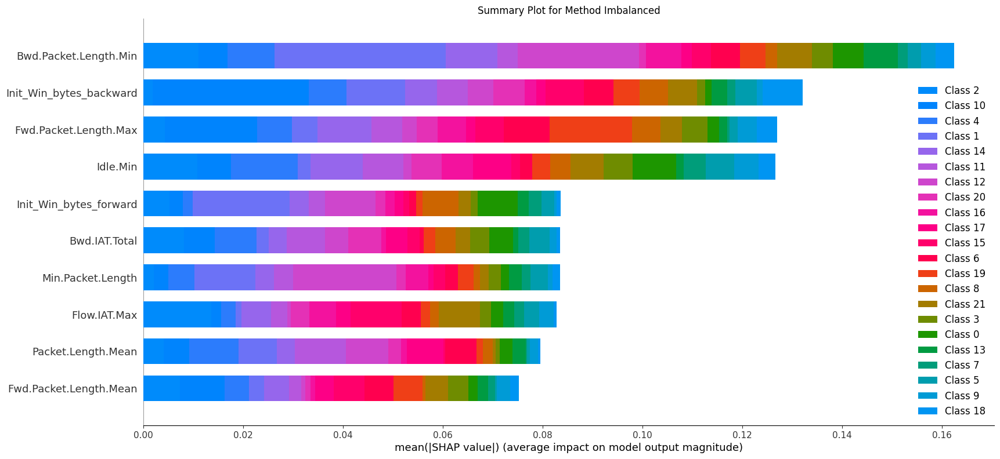

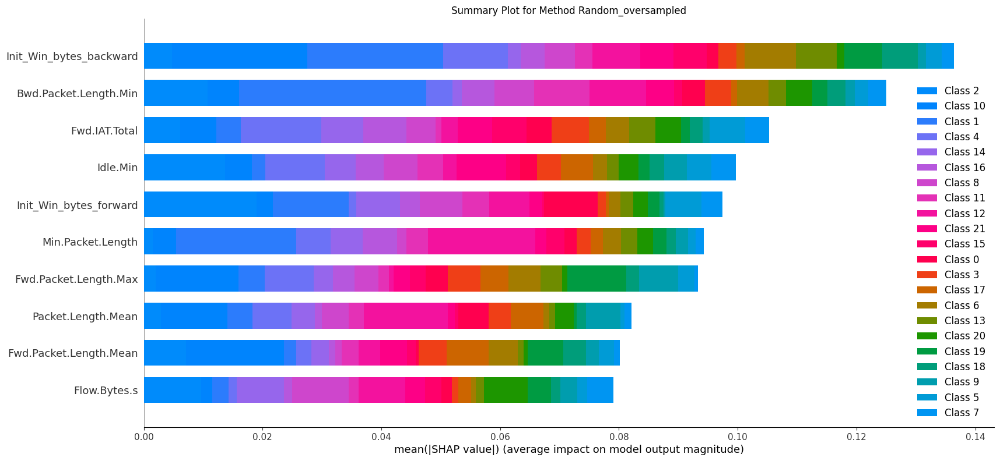

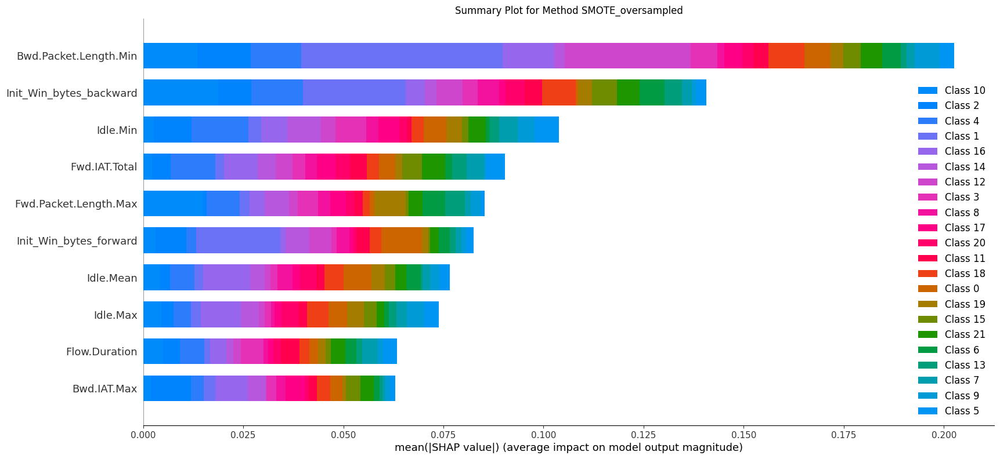

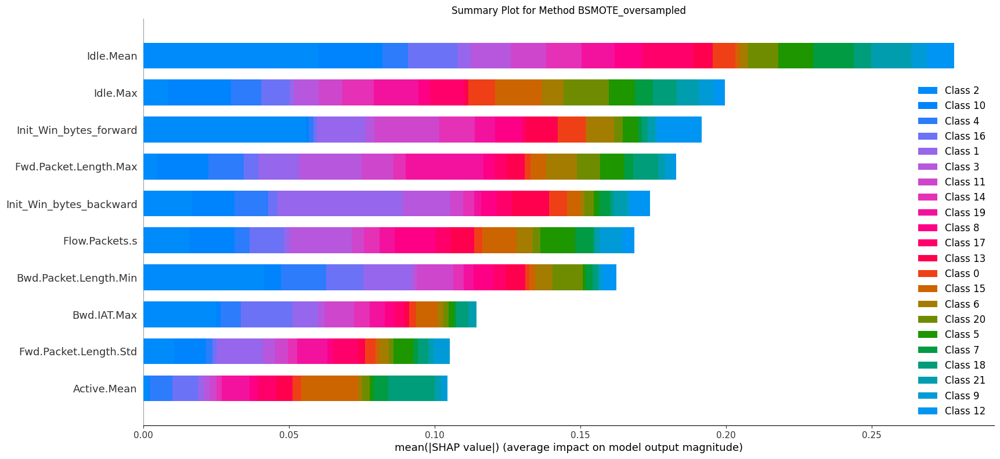

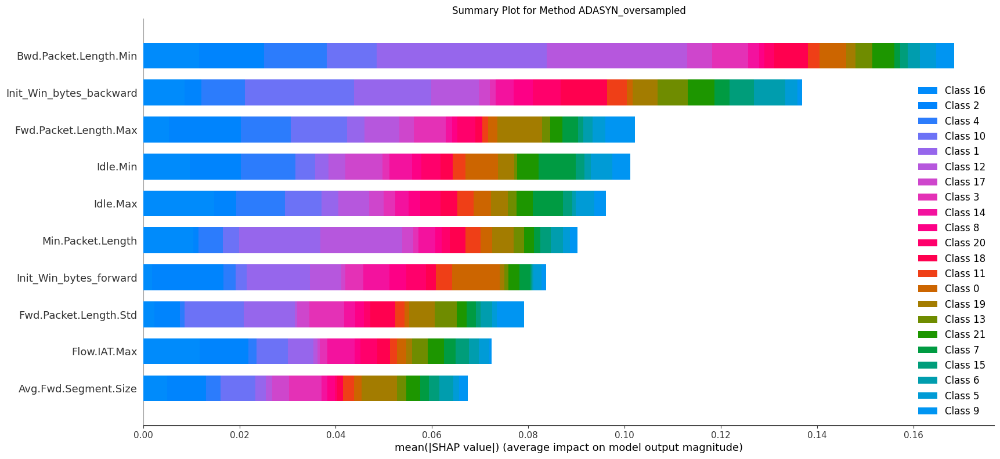

(5000, 67)
(5000, 67)


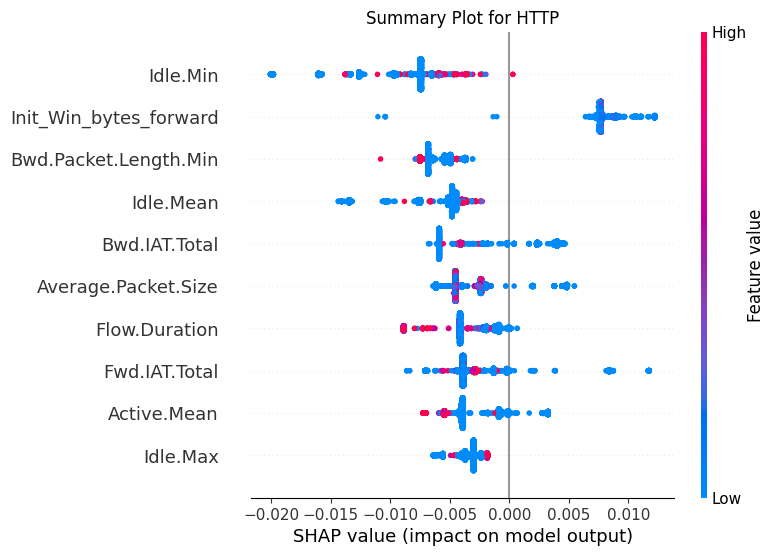

(5000, 67)
(5000, 67)


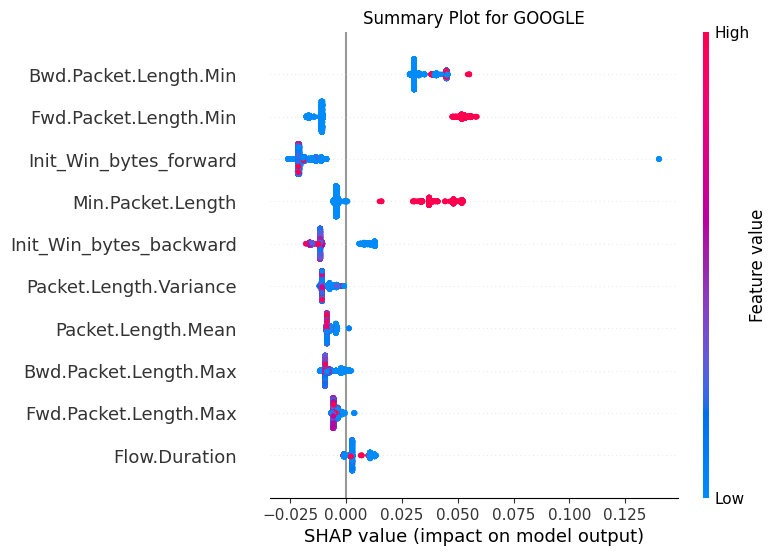

(5000, 67)
(5000, 67)


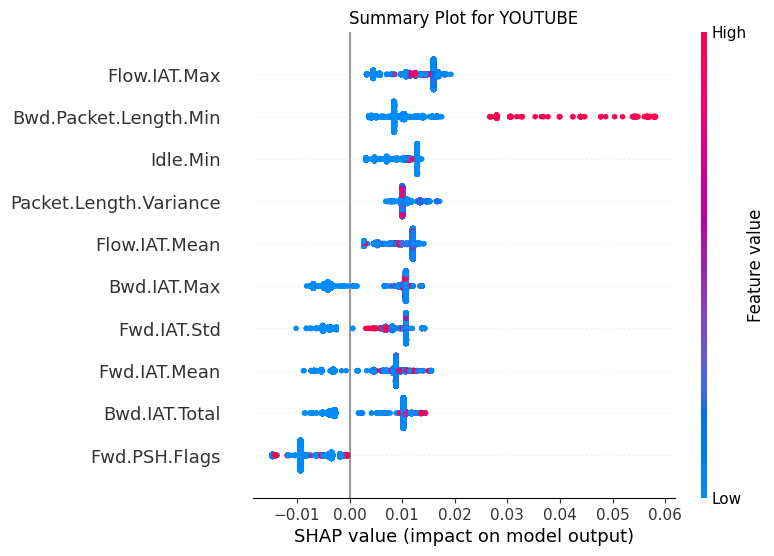

(5000, 67)
(5000, 67)


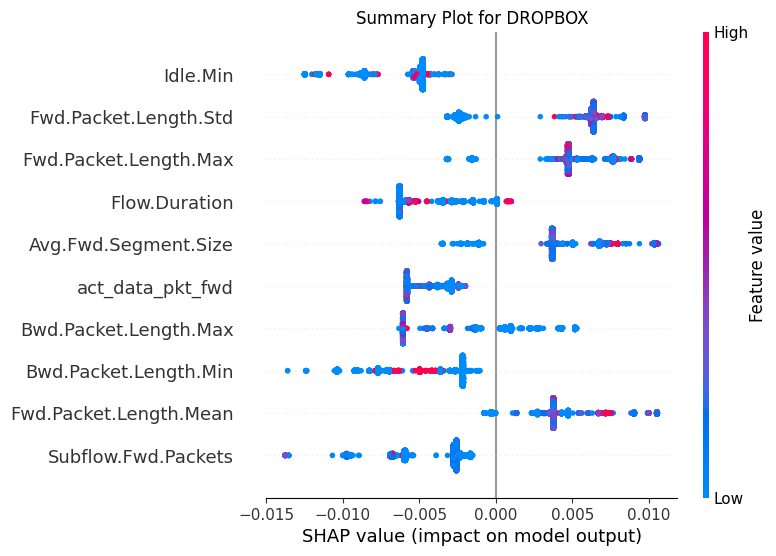

(5000, 67)
(5000, 67)


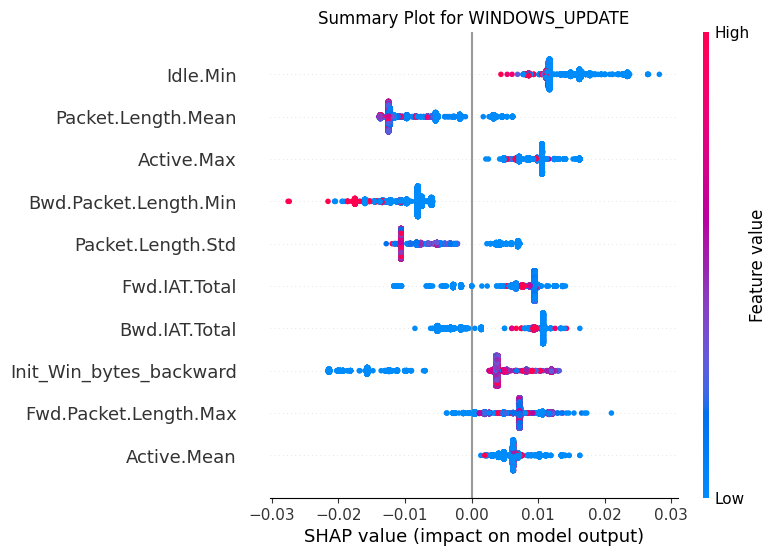

(5000, 67)
(5000, 67)


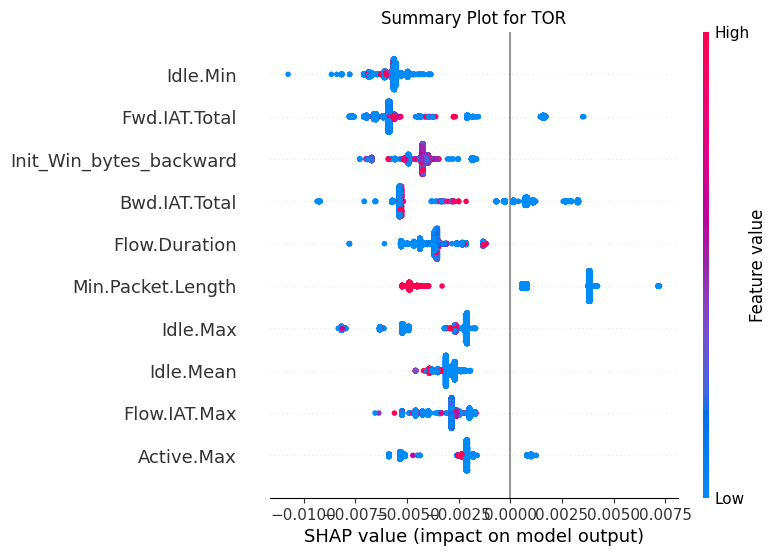

(5000, 67)
(5000, 67)


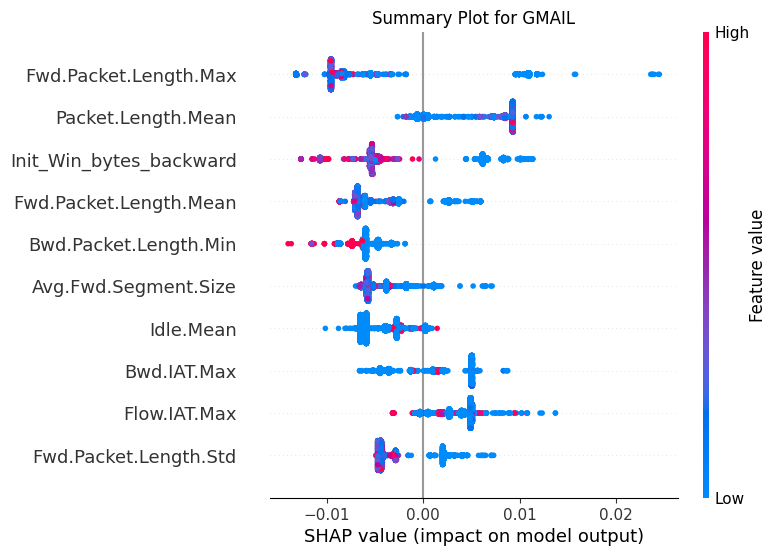

(5000, 67)
(5000, 67)


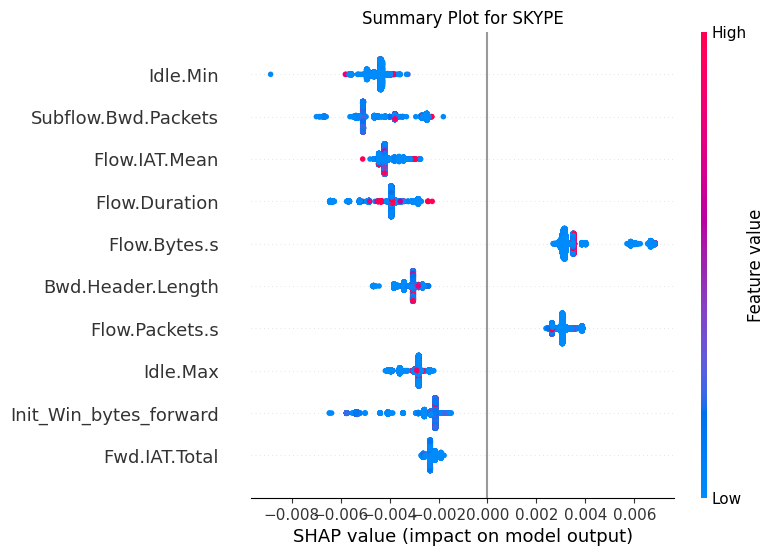

(5000, 67)
(5000, 67)


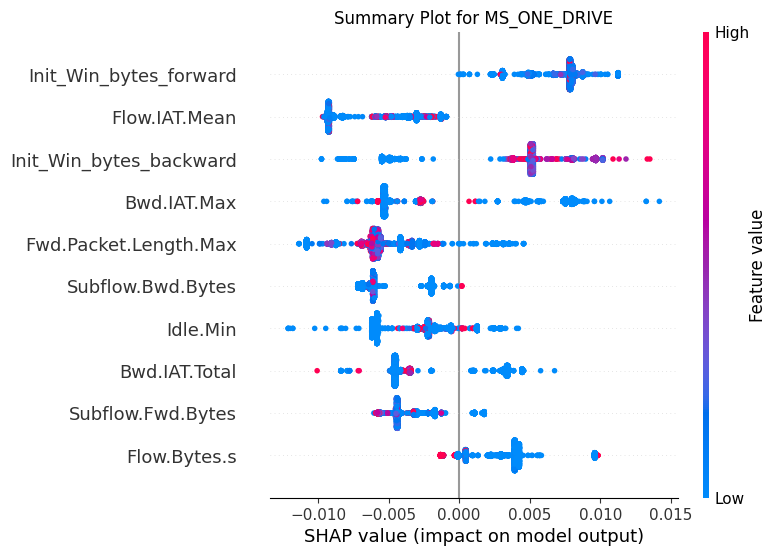

(5000, 67)
(5000, 67)


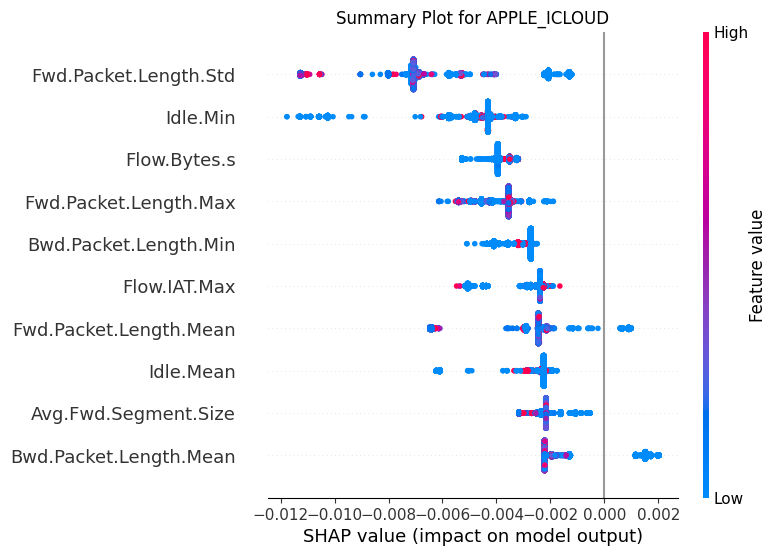

(5000, 67)
(5000, 67)


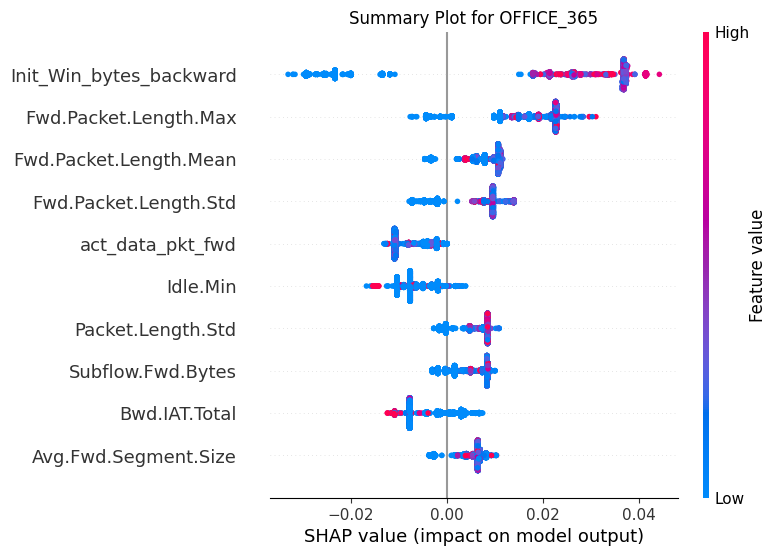

(5000, 67)
(5000, 67)


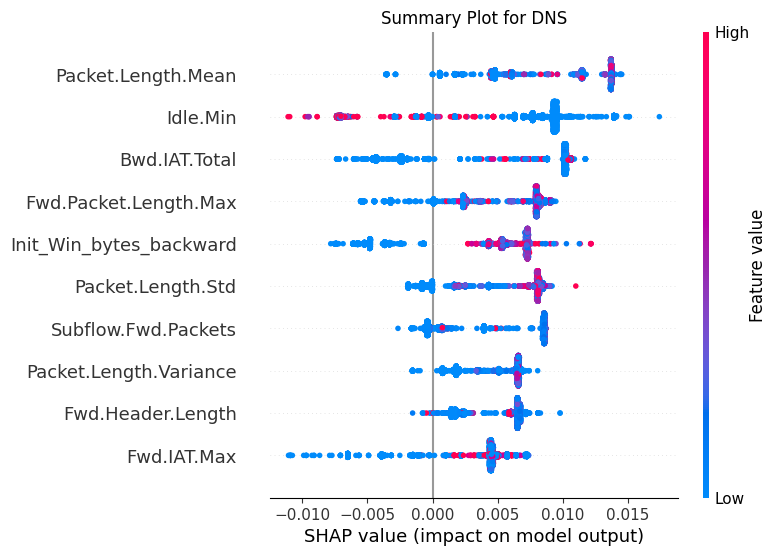

(5000, 67)
(5000, 67)


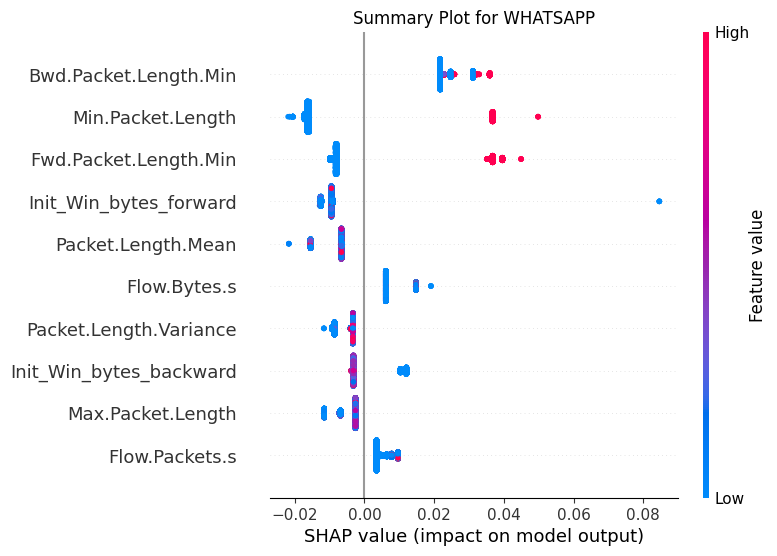

(5000, 67)
(5000, 67)


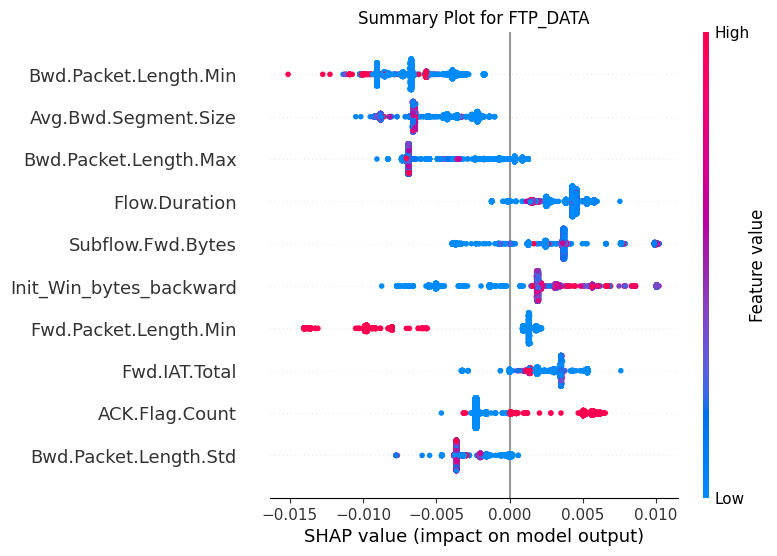

(5000, 67)
(5000, 67)


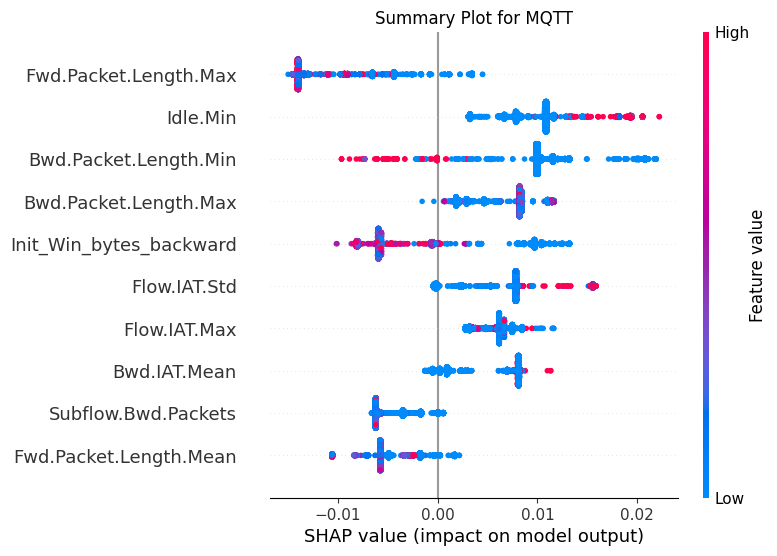

(5000, 67)
(5000, 67)


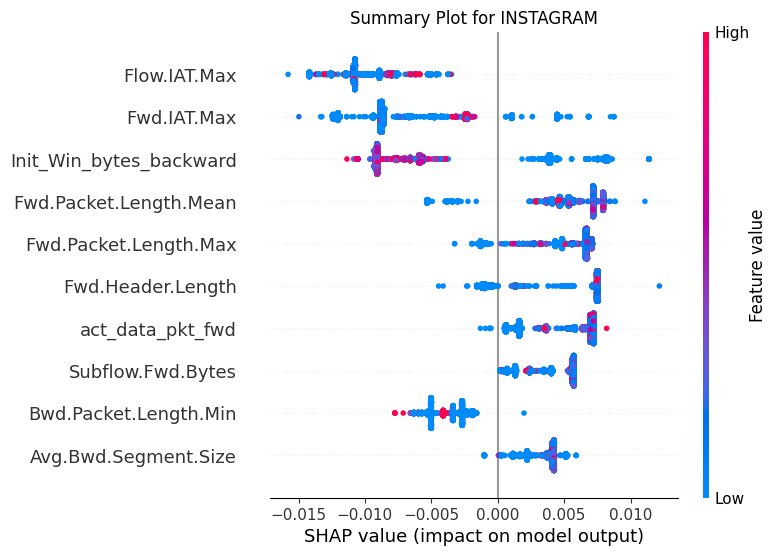

(5000, 67)
(5000, 67)


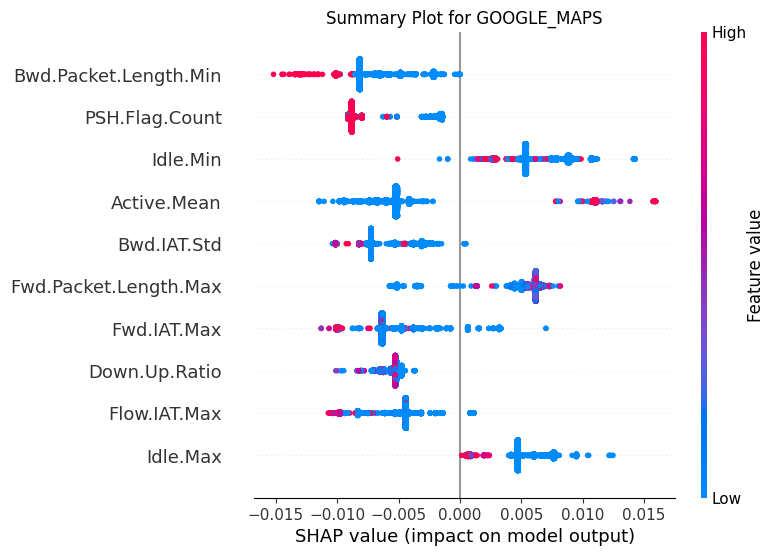

(5000, 67)
(5000, 67)


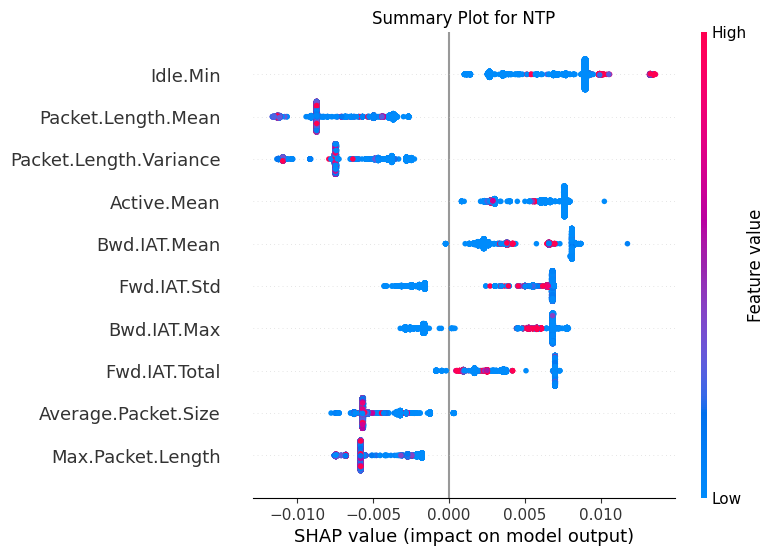

(5000, 67)
(5000, 67)


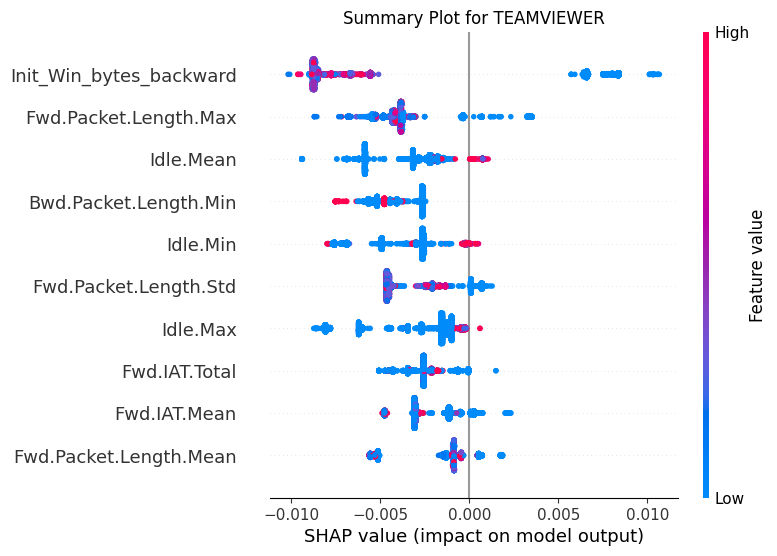

(5000, 67)
(5000, 67)


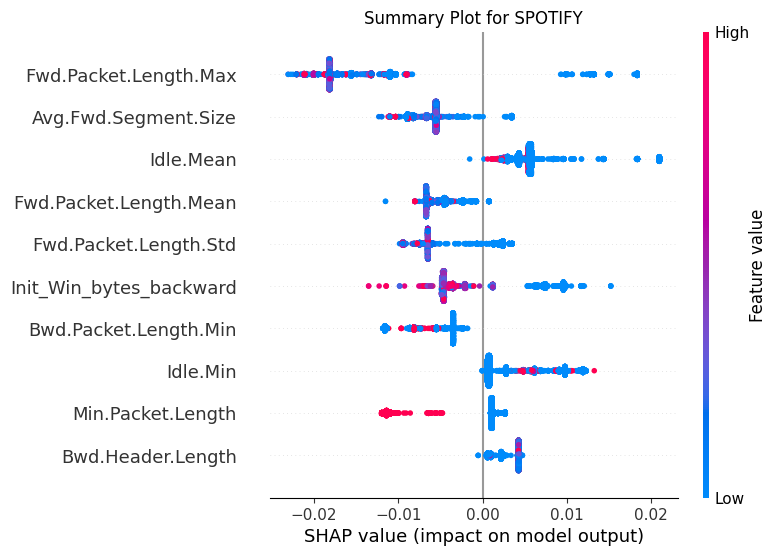

(5000, 67)
(5000, 67)


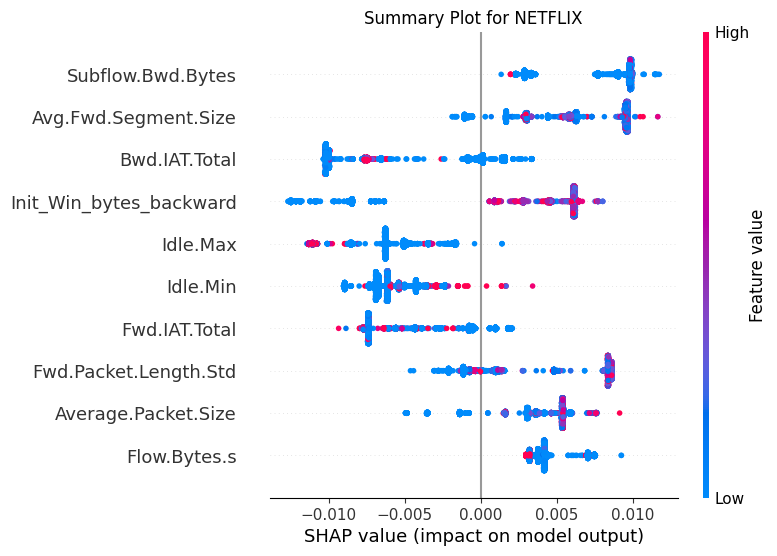

(5000, 67)
(5000, 67)


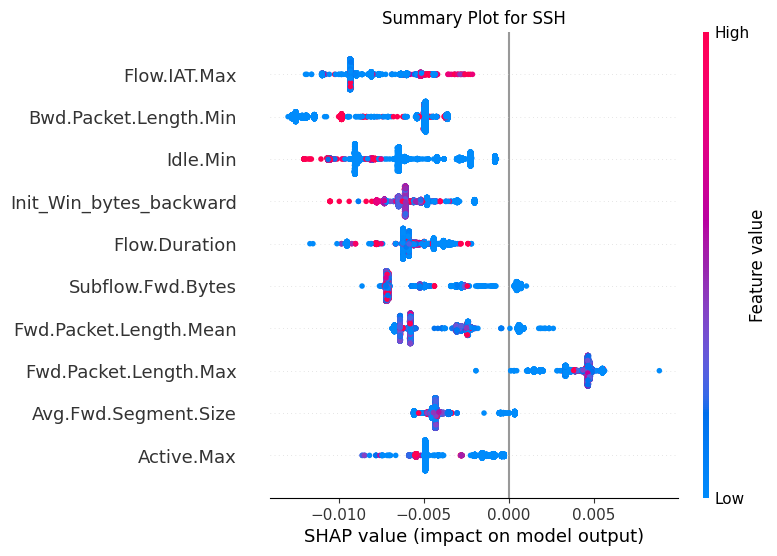

(5000, 67)
(5000, 67)


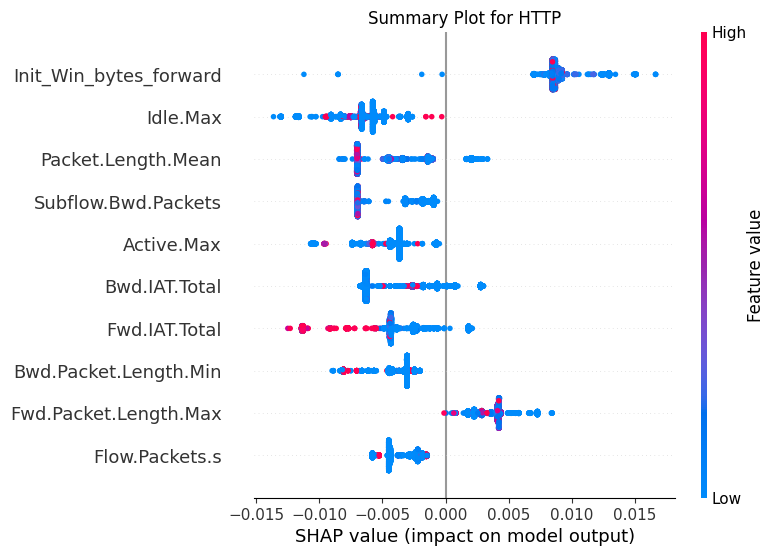

(5000, 67)
(5000, 67)


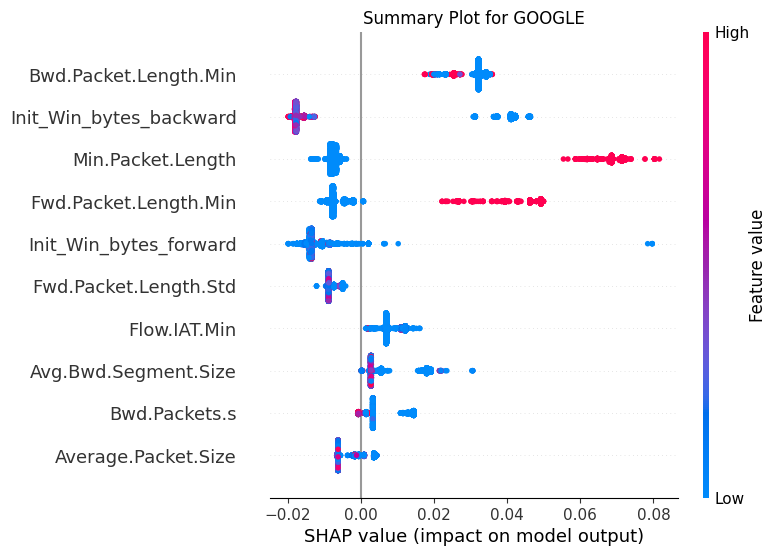

(5000, 67)
(5000, 67)


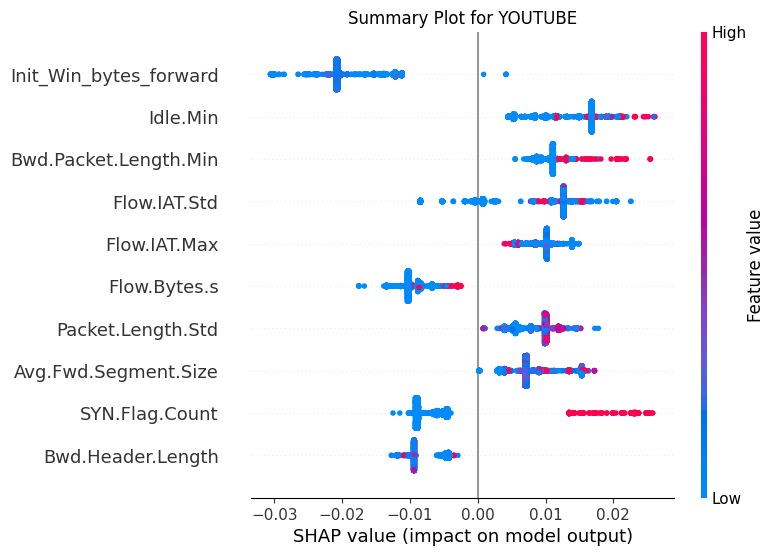

(5000, 67)
(5000, 67)


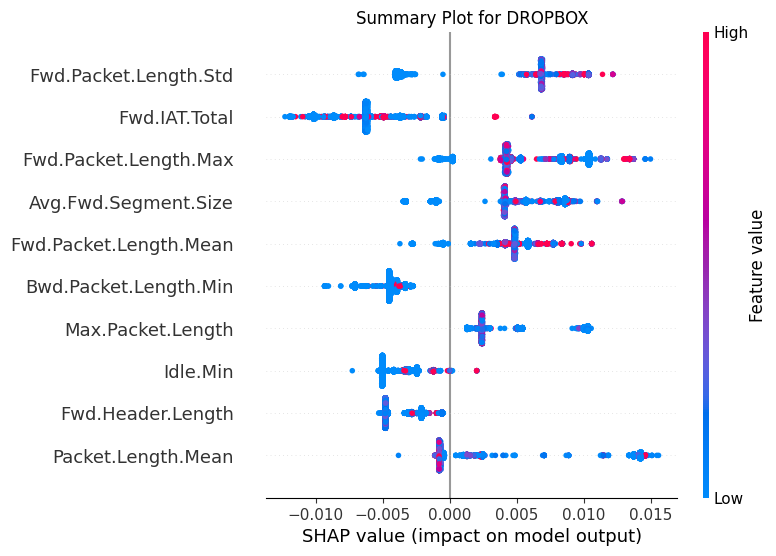

(5000, 67)
(5000, 67)


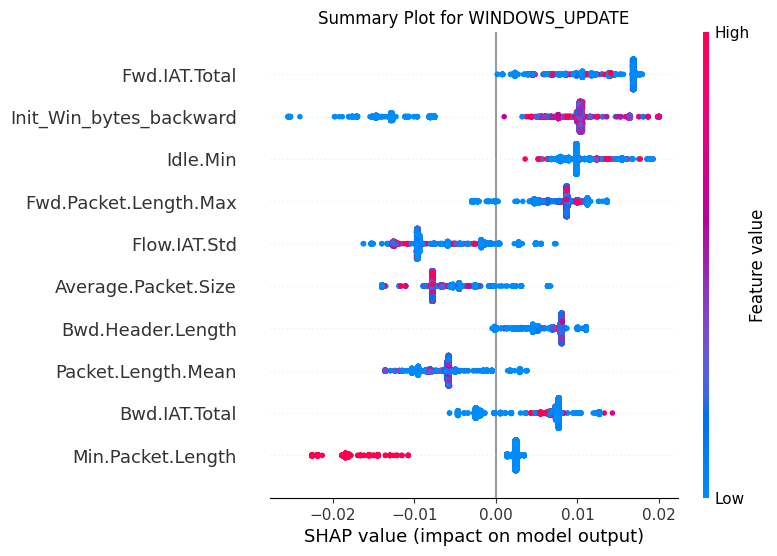

(5000, 67)
(5000, 67)


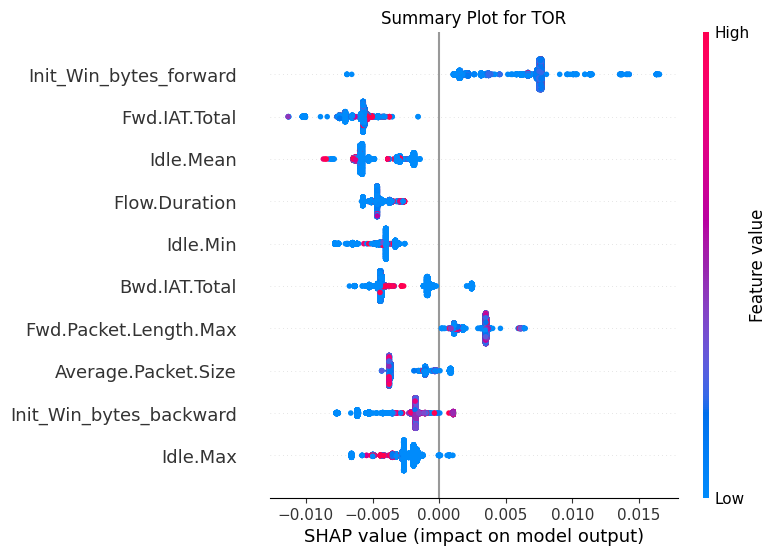

(5000, 67)
(5000, 67)


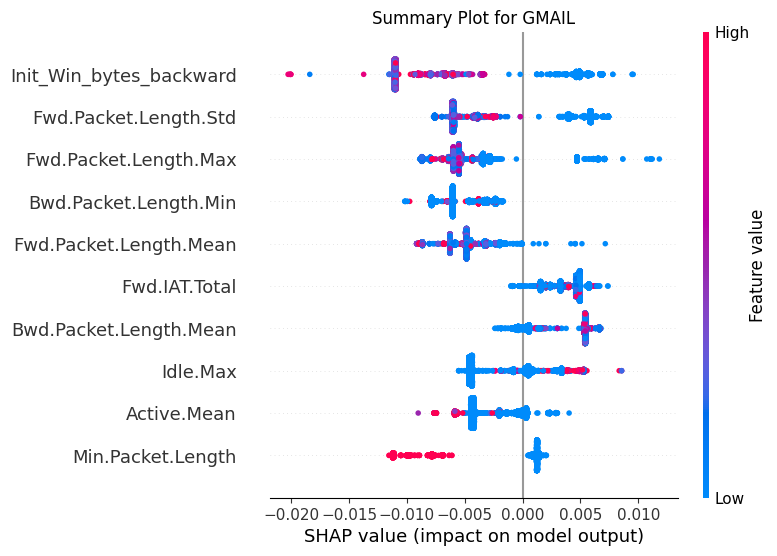

(5000, 67)
(5000, 67)


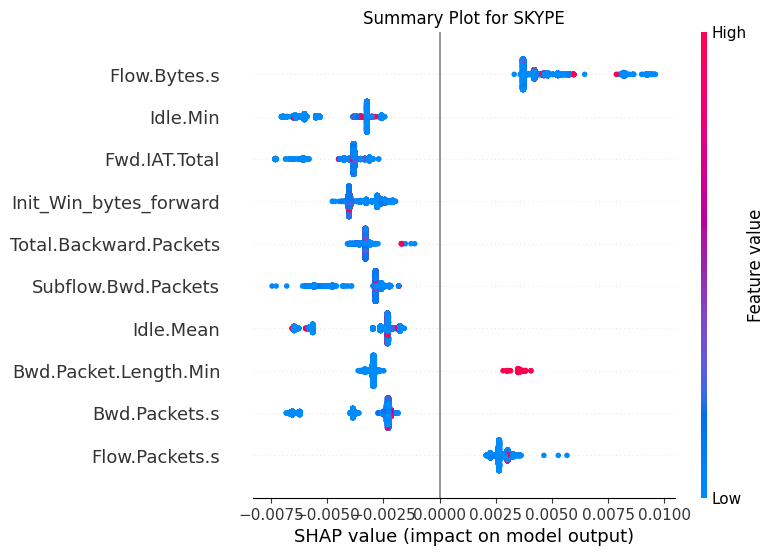

(5000, 67)
(5000, 67)


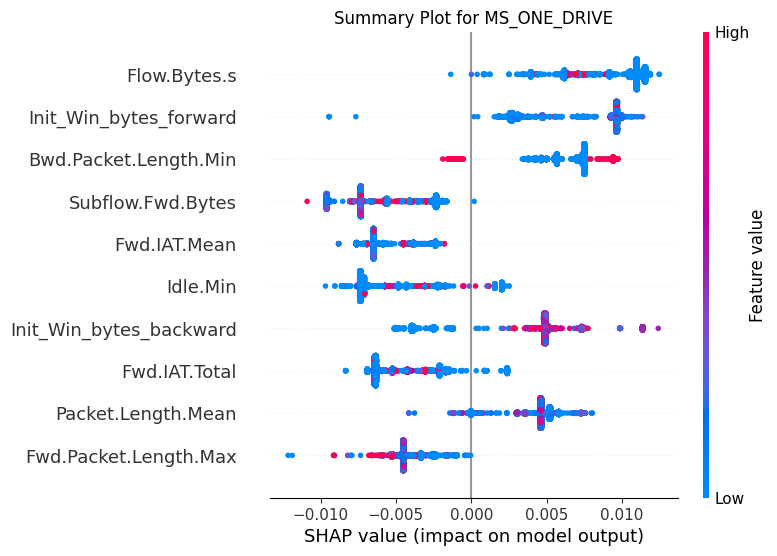

(5000, 67)
(5000, 67)


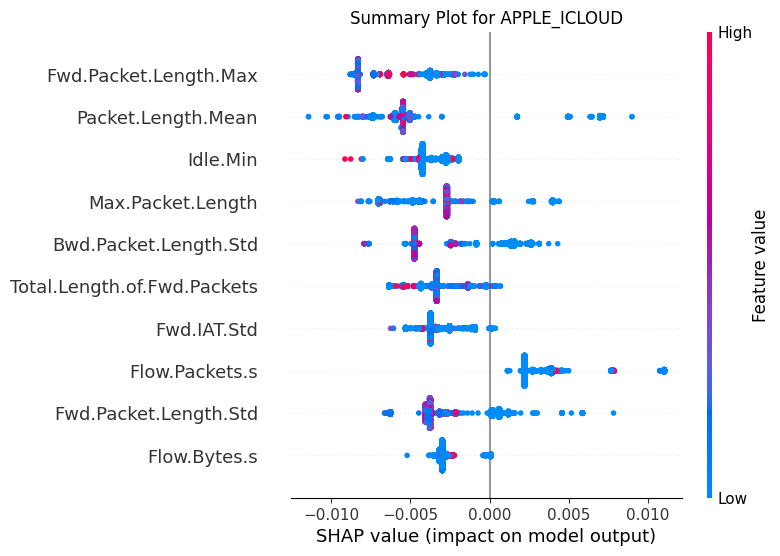

(5000, 67)
(5000, 67)


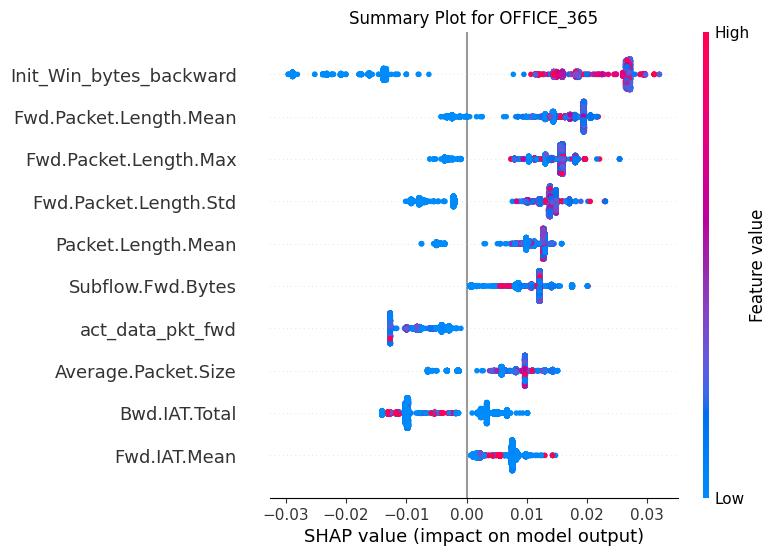

(5000, 67)
(5000, 67)


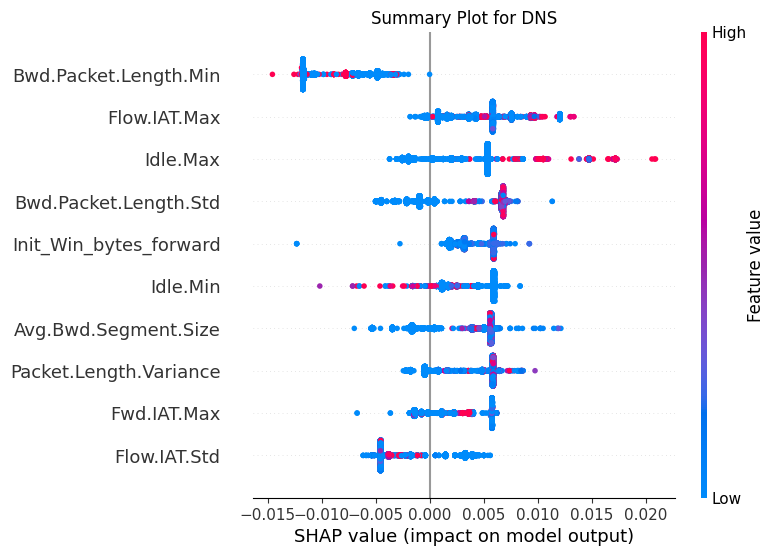

(5000, 67)
(5000, 67)


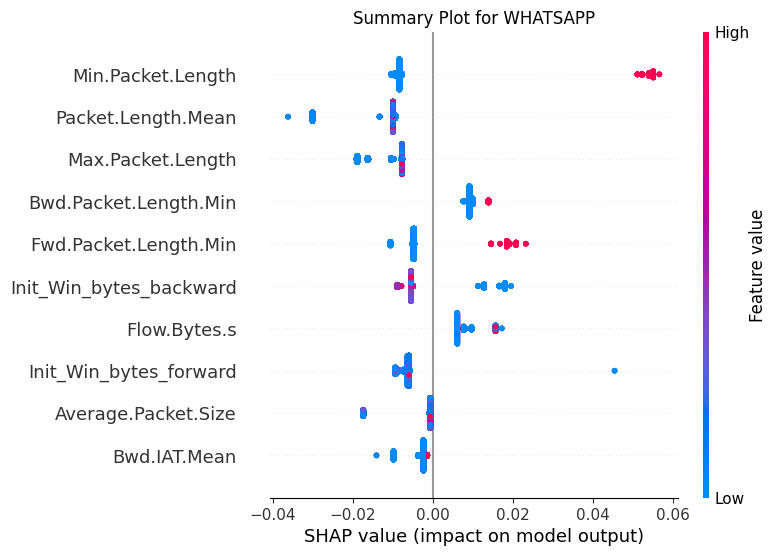

(5000, 67)
(5000, 67)


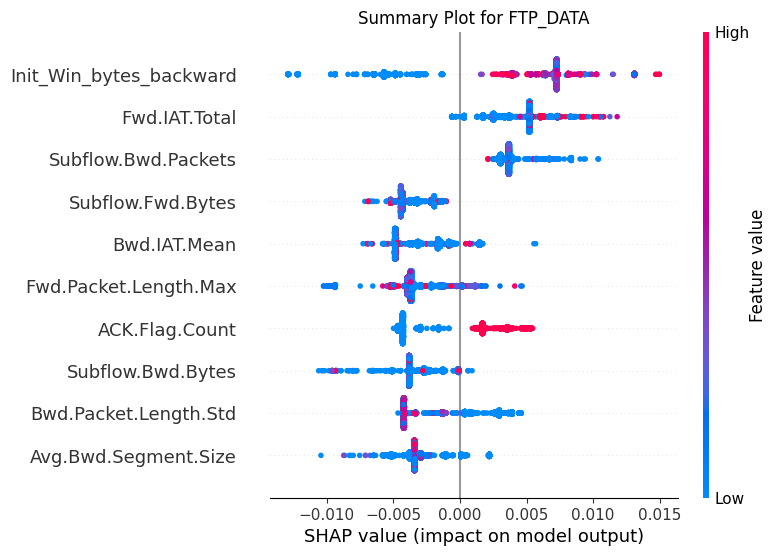

(5000, 67)
(5000, 67)


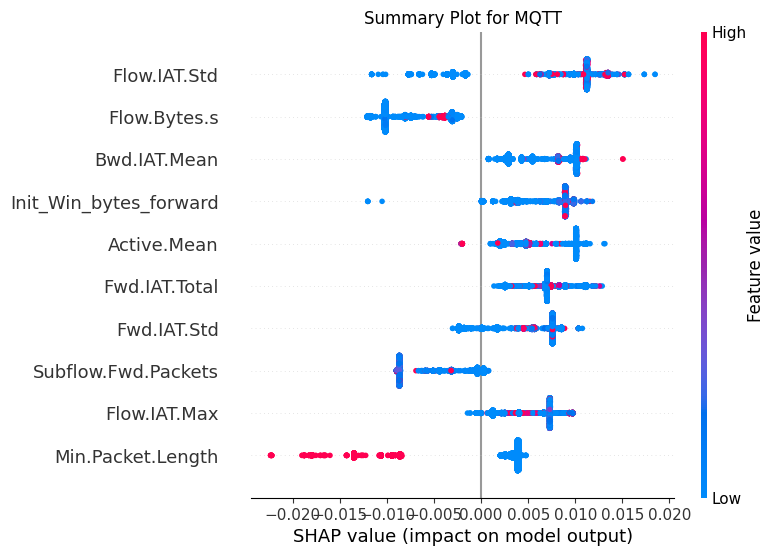

(5000, 67)
(5000, 67)


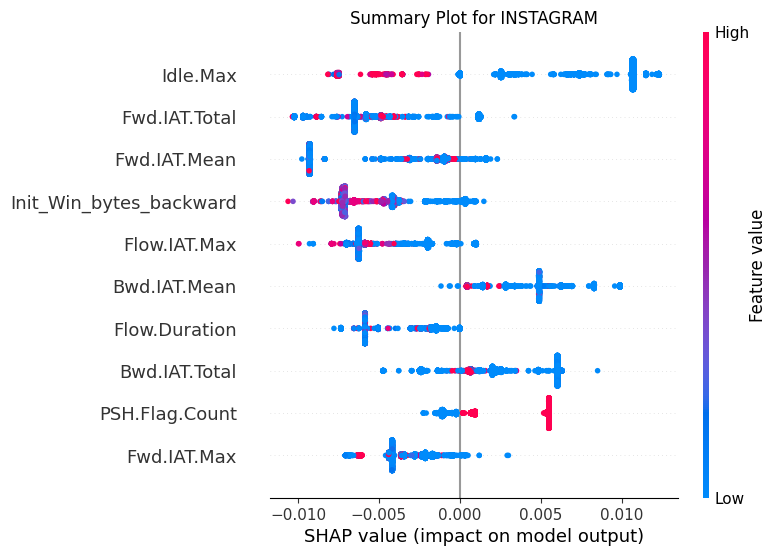

(5000, 67)
(5000, 67)


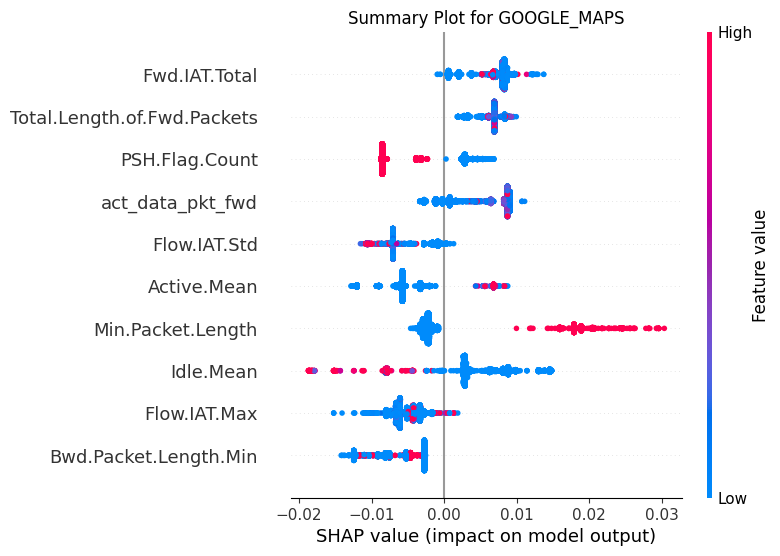

(5000, 67)
(5000, 67)


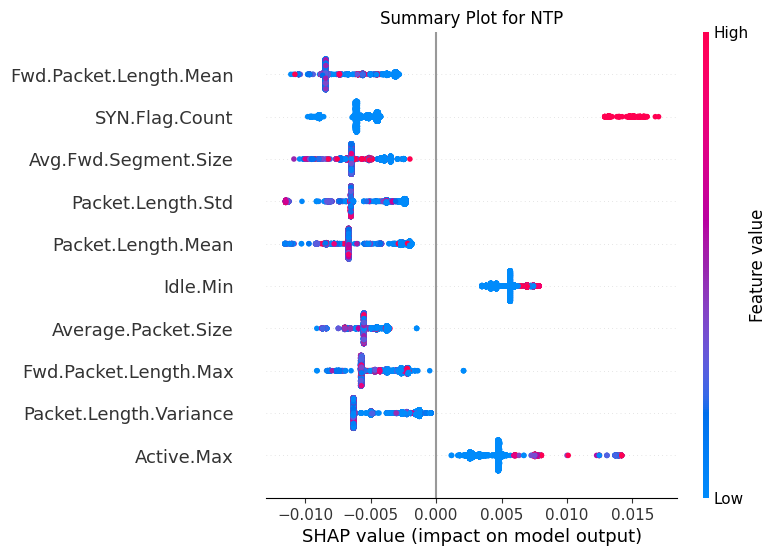

(5000, 67)
(5000, 67)


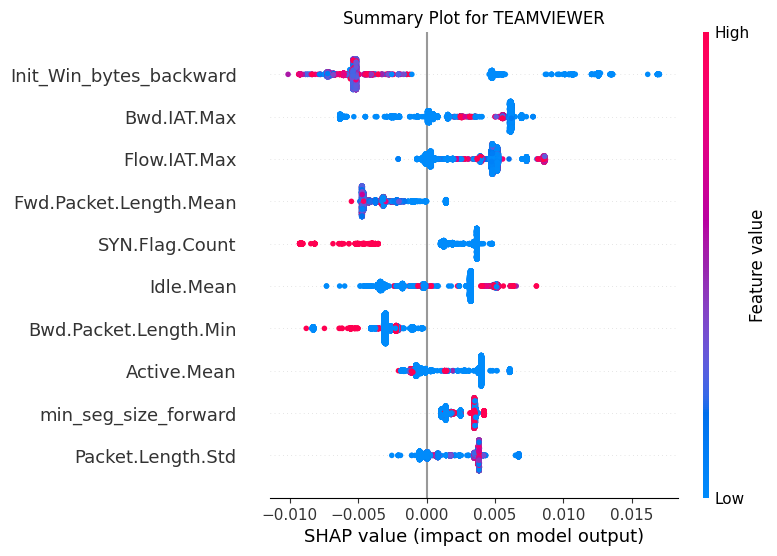

(5000, 67)
(5000, 67)


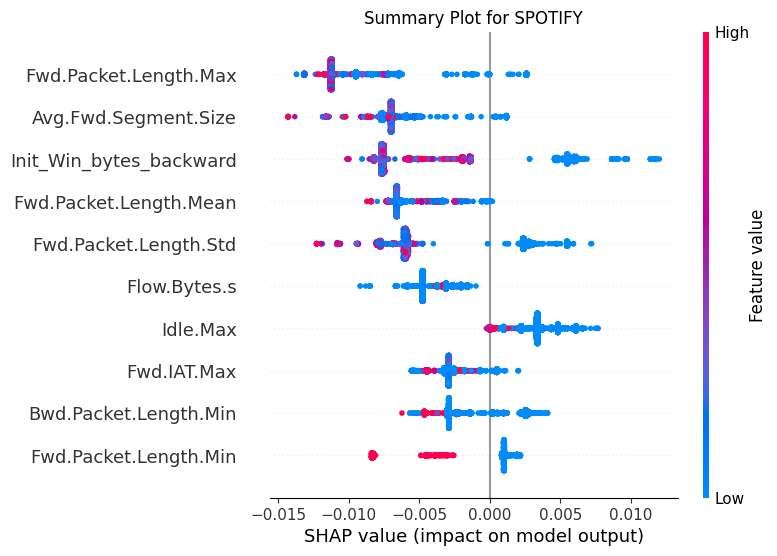

(5000, 67)
(5000, 67)


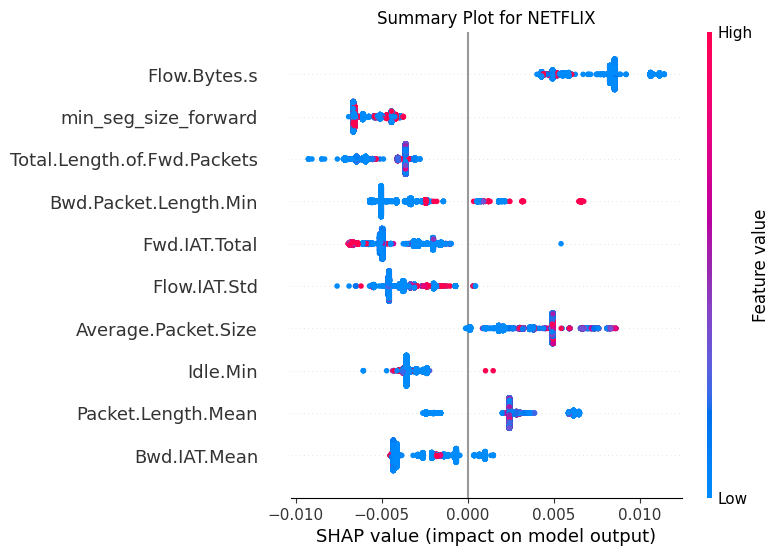

(5000, 67)
(5000, 67)


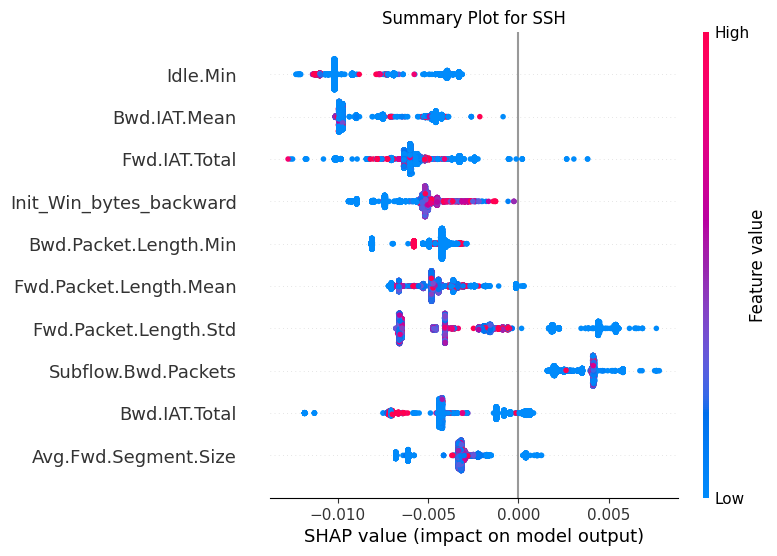

(5000, 67)
(5000, 67)


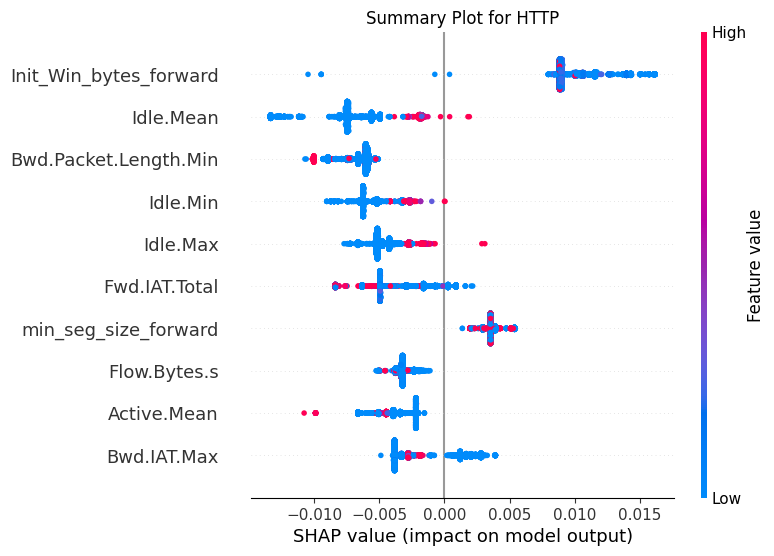

(5000, 67)
(5000, 67)


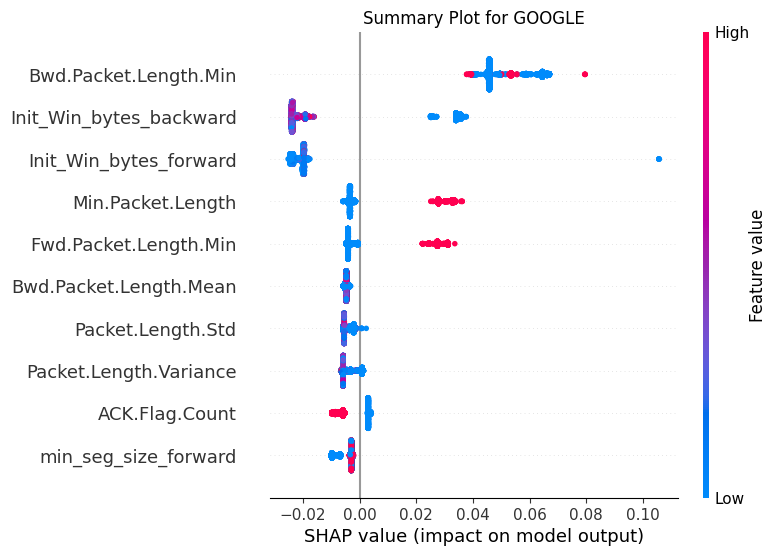

(5000, 67)
(5000, 67)


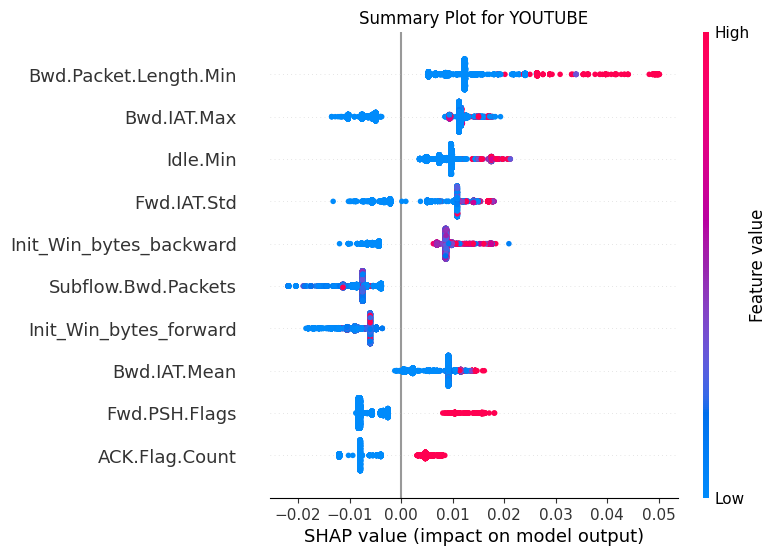

(5000, 67)
(5000, 67)


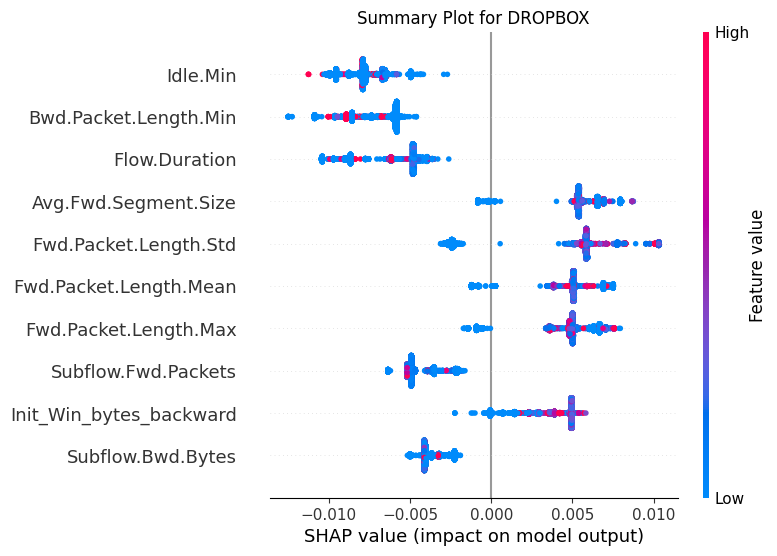

(5000, 67)
(5000, 67)


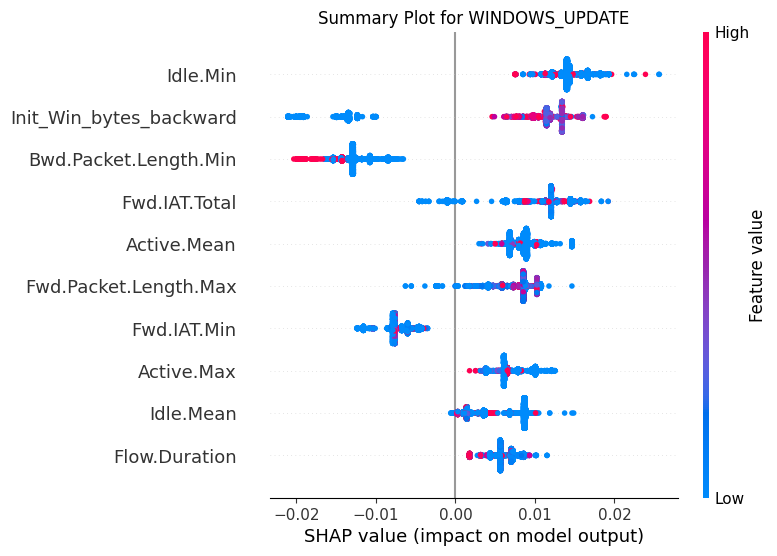

(5000, 67)
(5000, 67)


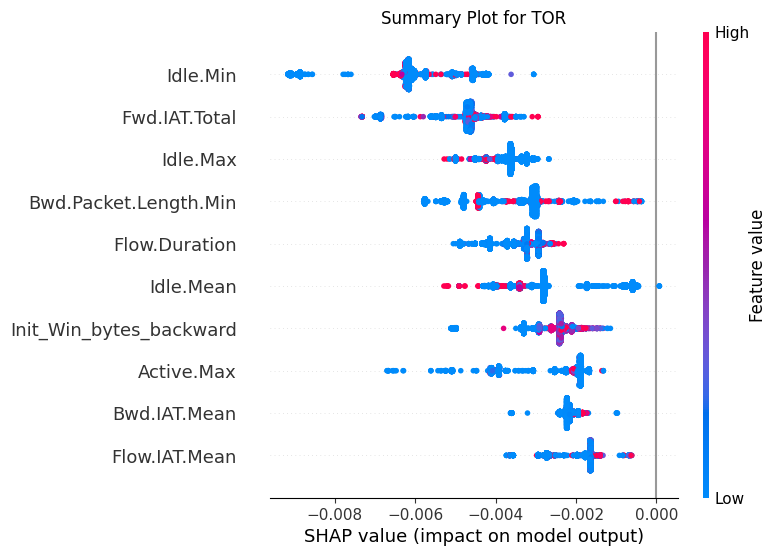

(5000, 67)
(5000, 67)


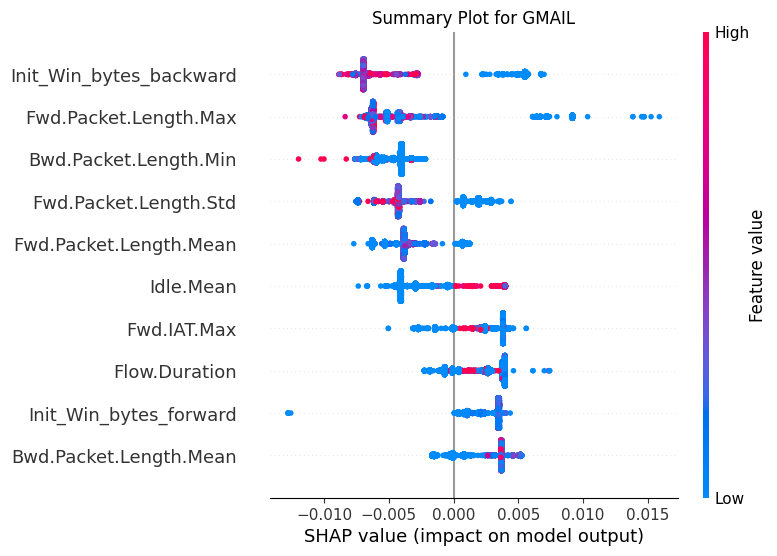

(5000, 67)
(5000, 67)


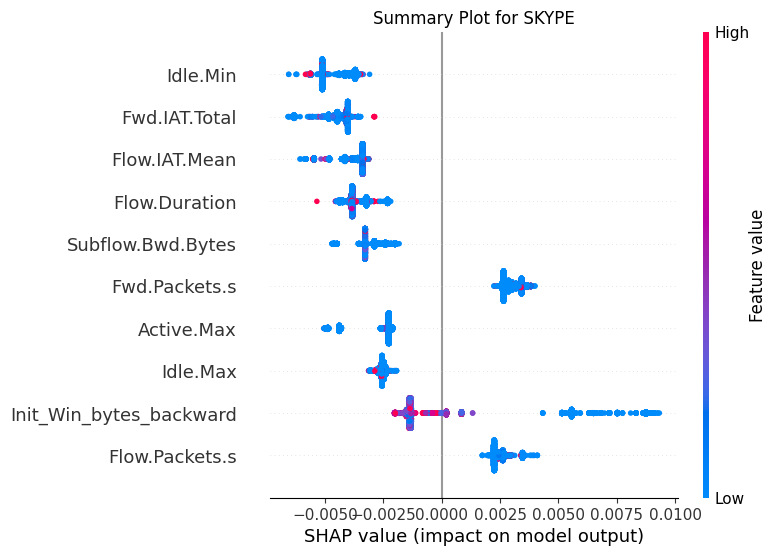

(5000, 67)
(5000, 67)


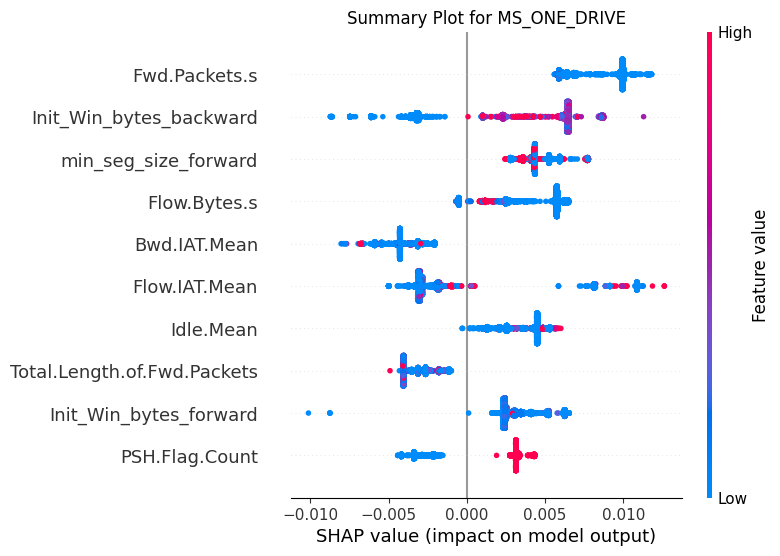

(5000, 67)
(5000, 67)


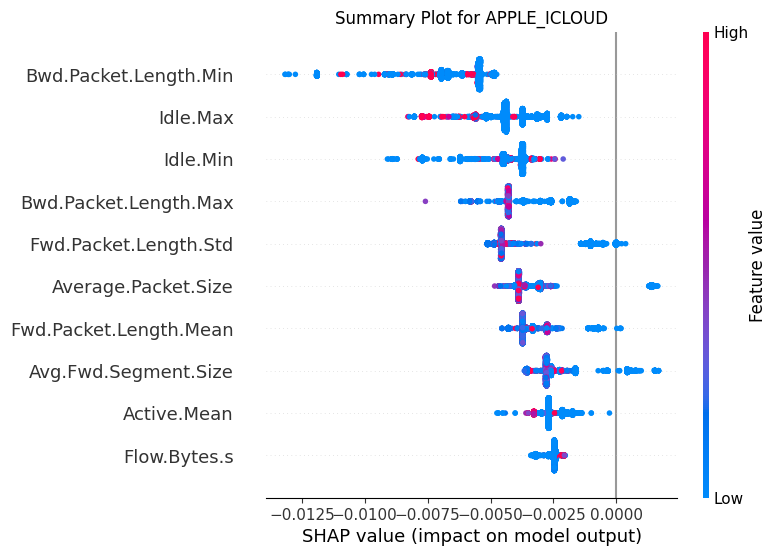

(5000, 67)
(5000, 67)


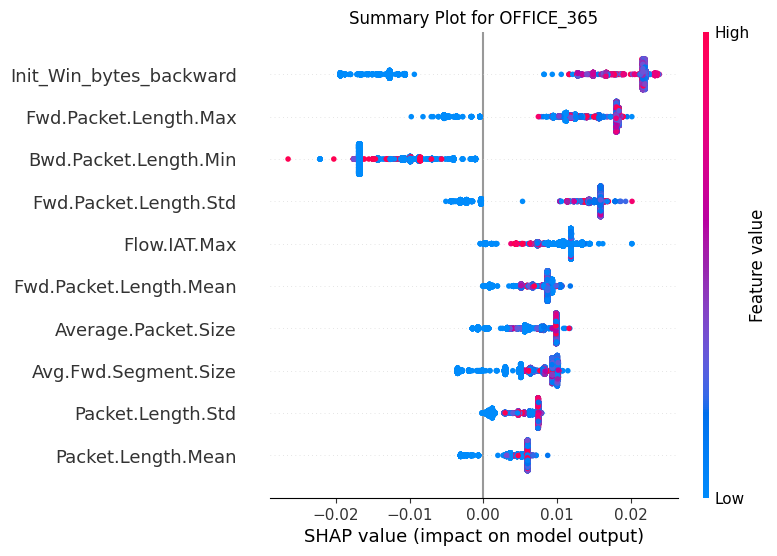

(5000, 67)
(5000, 67)


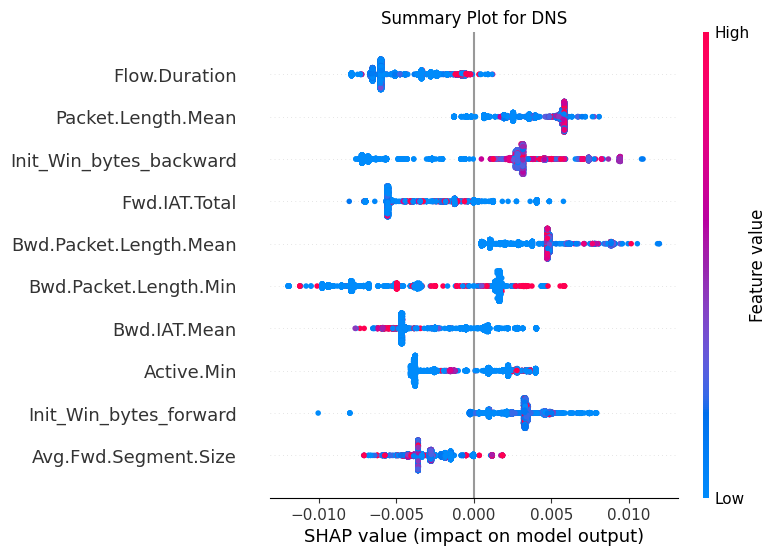

(5000, 67)
(5000, 67)


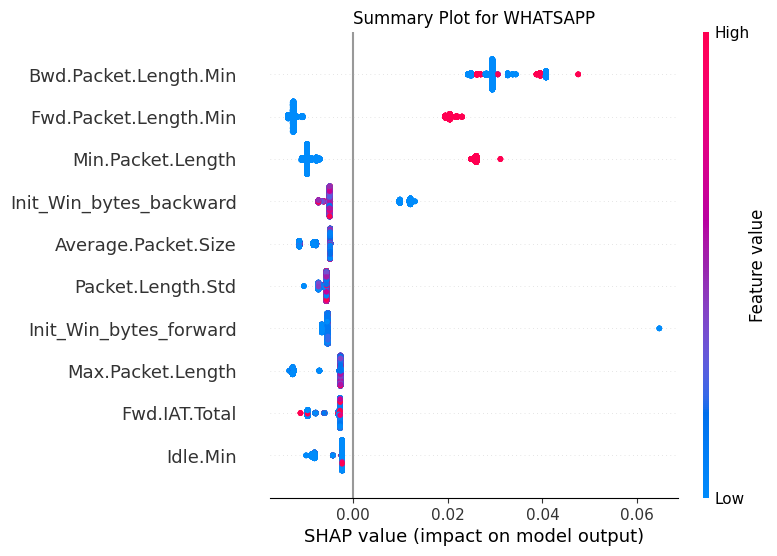

(5000, 67)
(5000, 67)


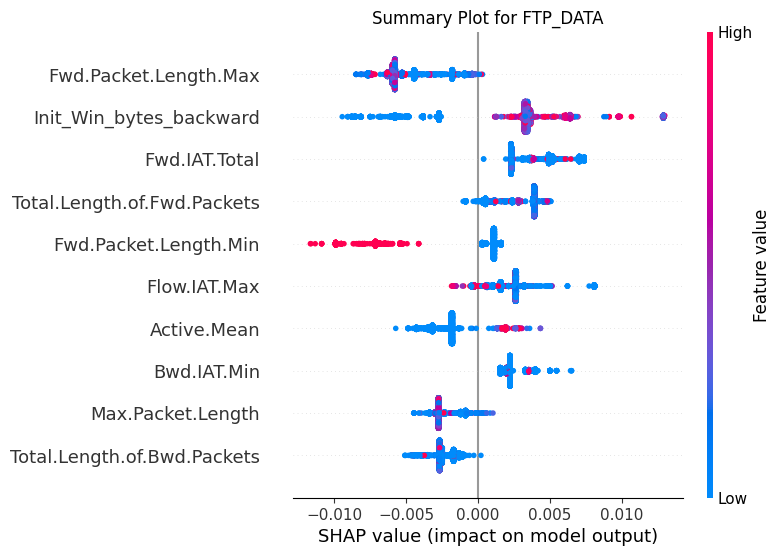

(5000, 67)
(5000, 67)


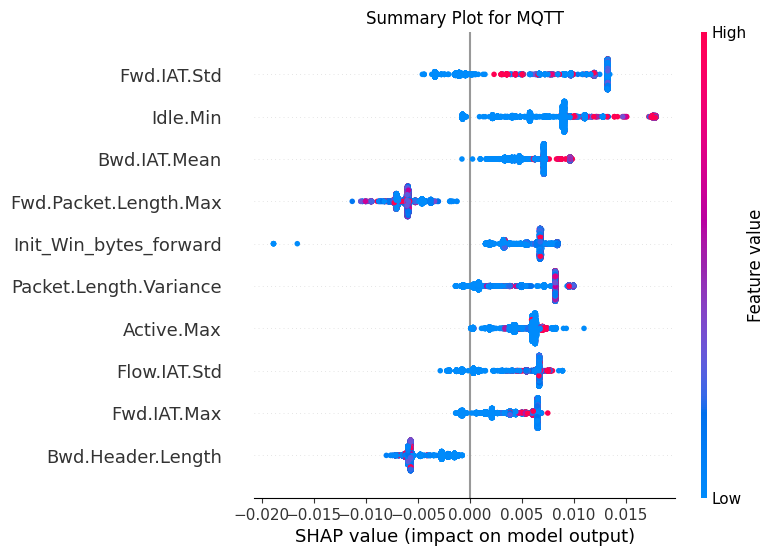

(5000, 67)
(5000, 67)


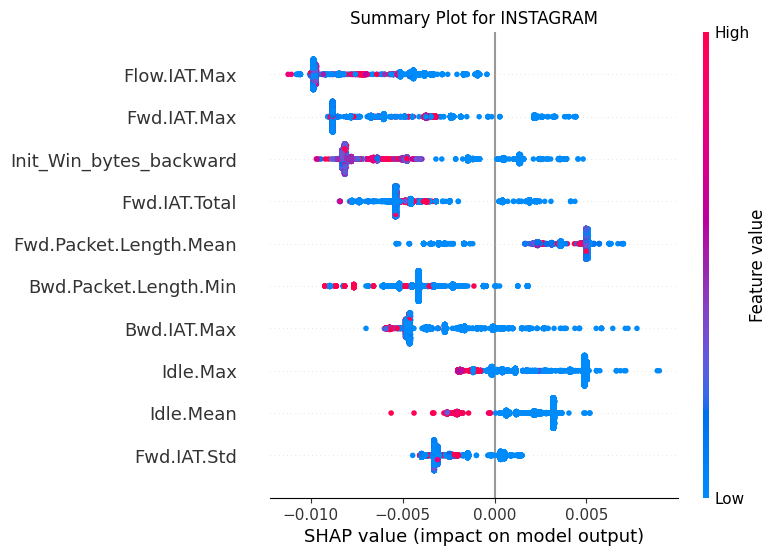

(5000, 67)
(5000, 67)


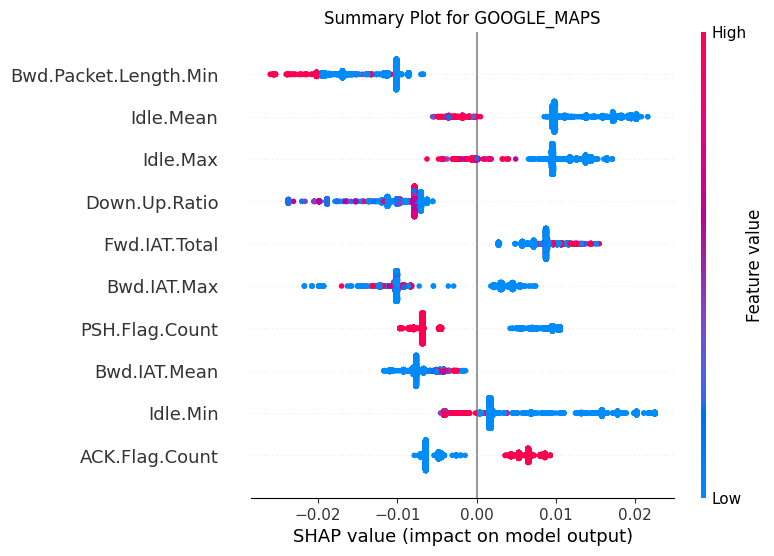

(5000, 67)
(5000, 67)


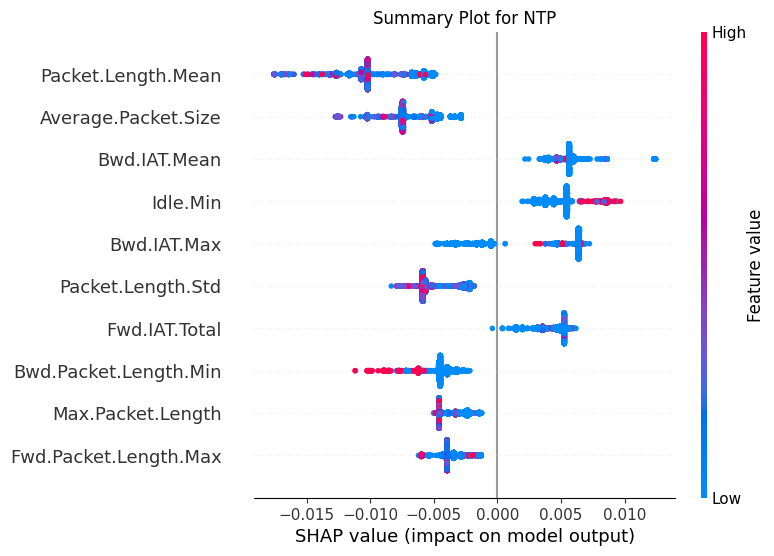

(5000, 67)
(5000, 67)


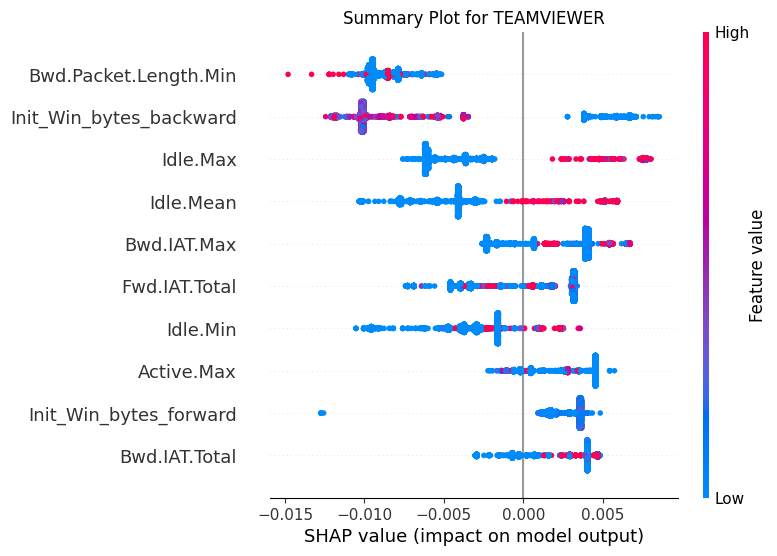

(5000, 67)
(5000, 67)


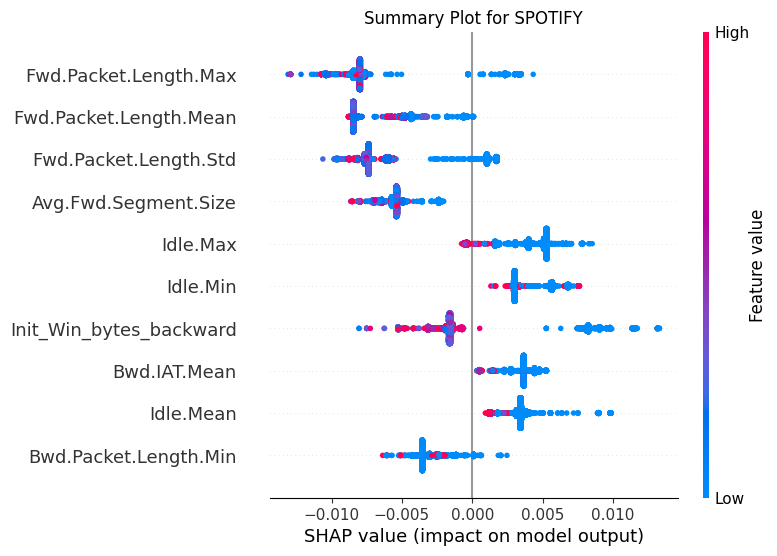

(5000, 67)
(5000, 67)


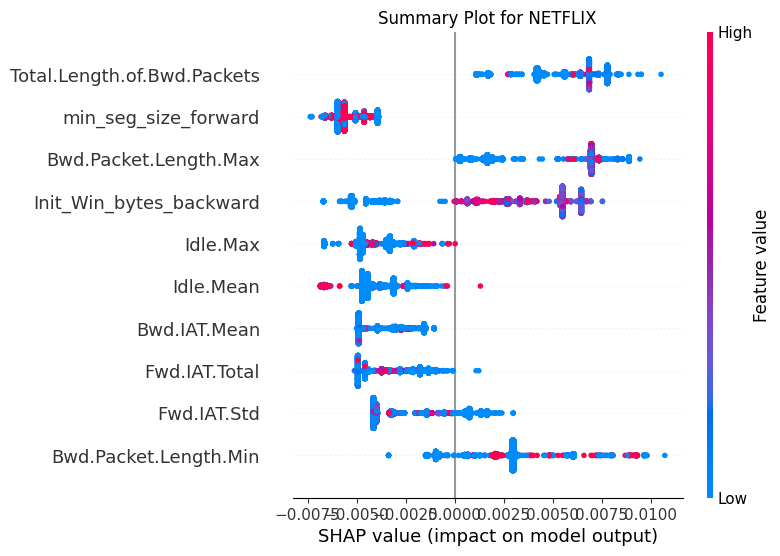

(5000, 67)
(5000, 67)


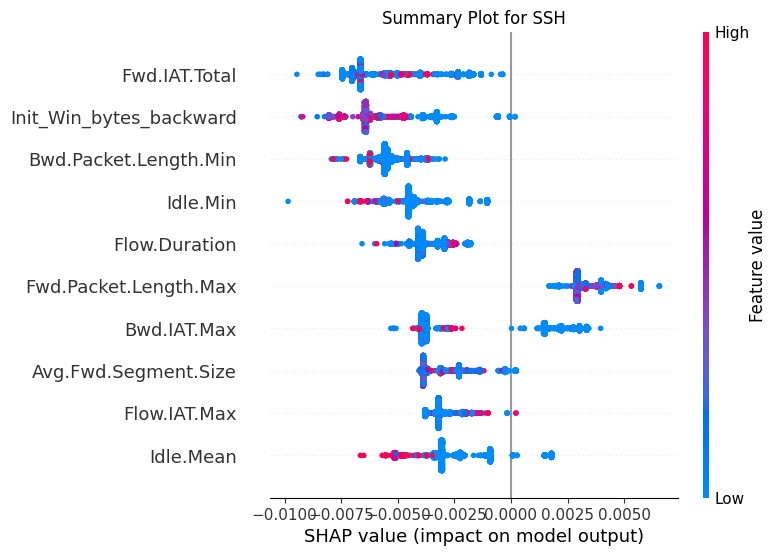

(5000, 67)
(5000, 67)


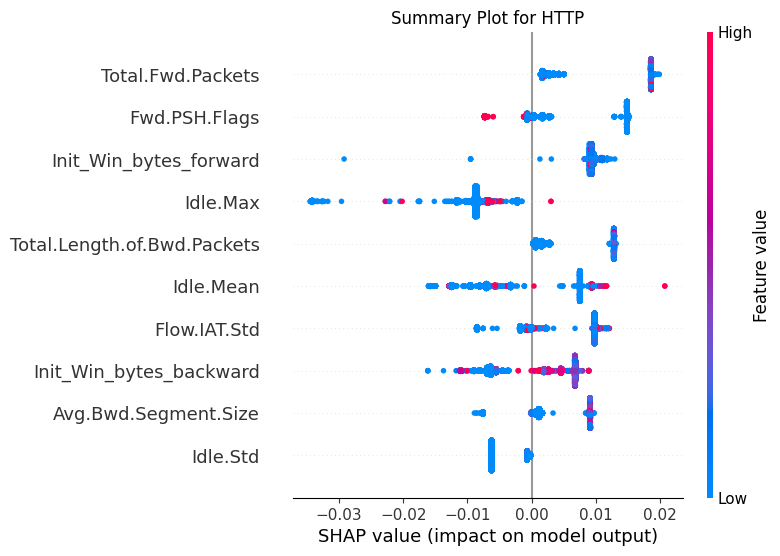

(5000, 67)
(5000, 67)


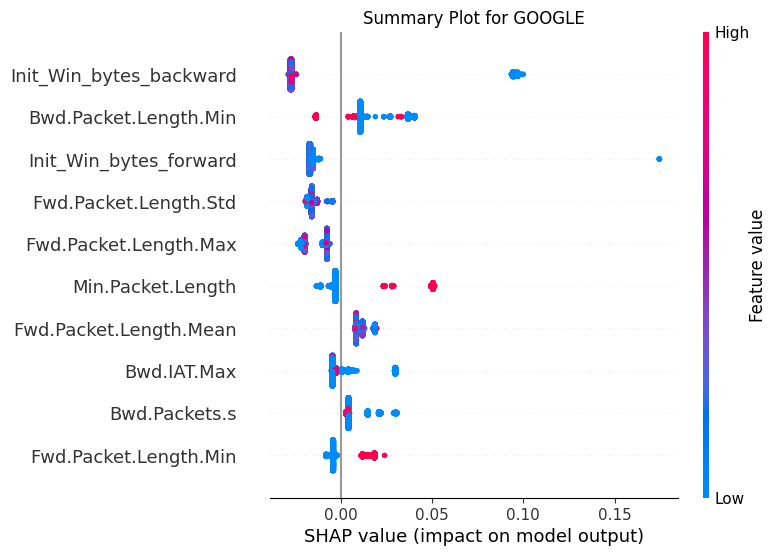

(5000, 67)
(5000, 67)


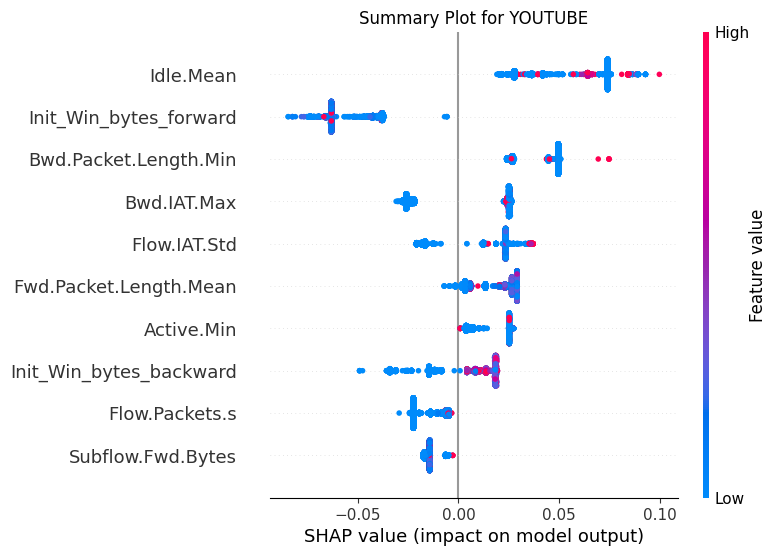

(5000, 67)
(5000, 67)


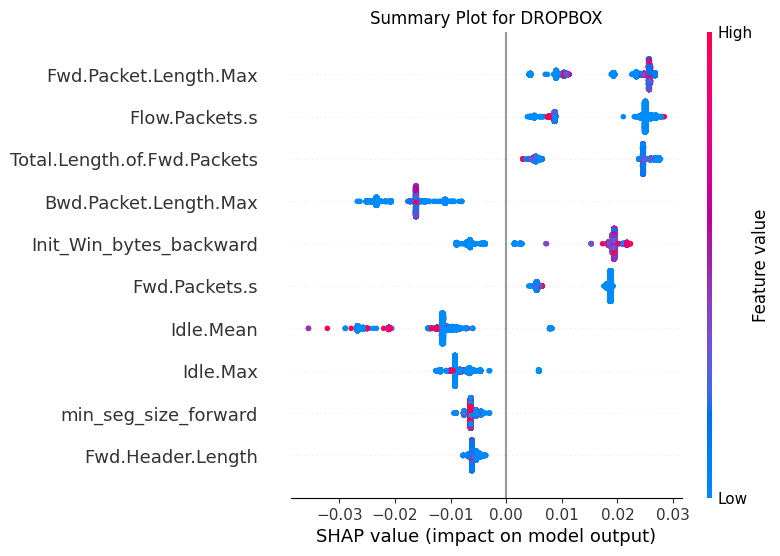

(5000, 67)
(5000, 67)


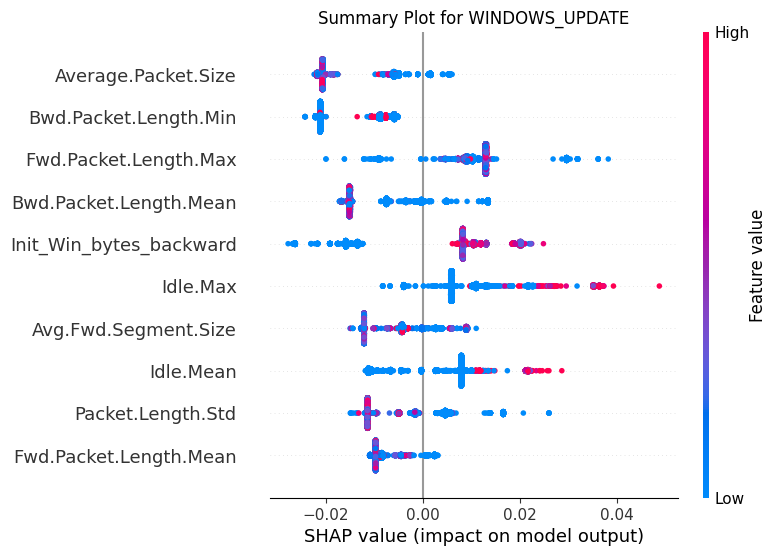

(5000, 67)
(5000, 67)


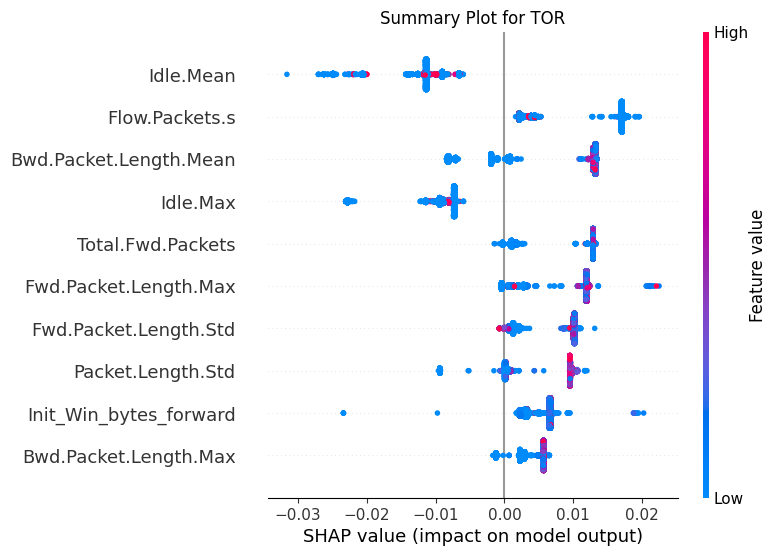

(5000, 67)
(5000, 67)


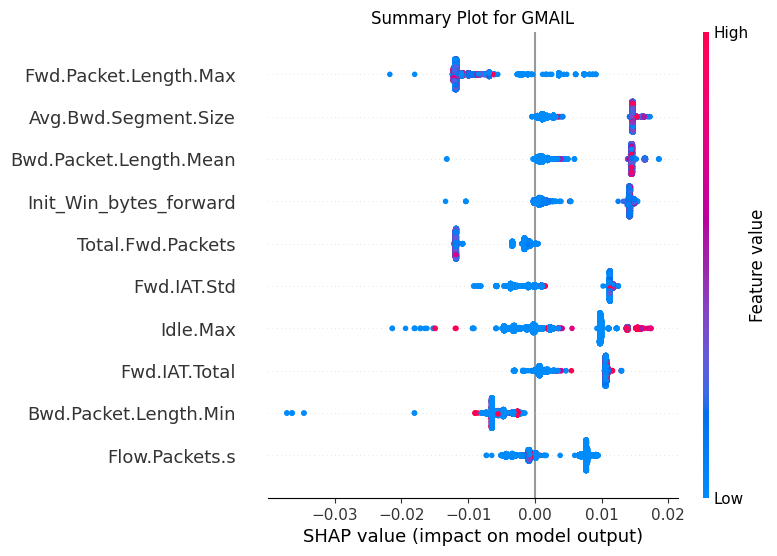

(5000, 67)
(5000, 67)


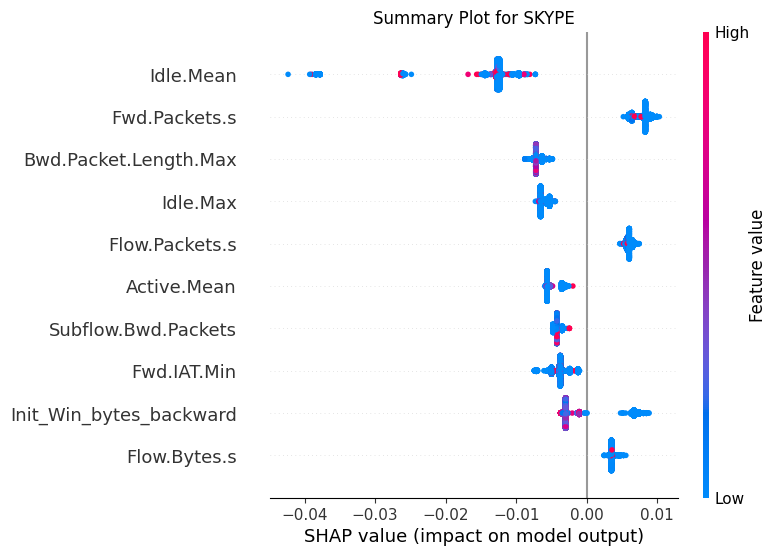

(5000, 67)
(5000, 67)


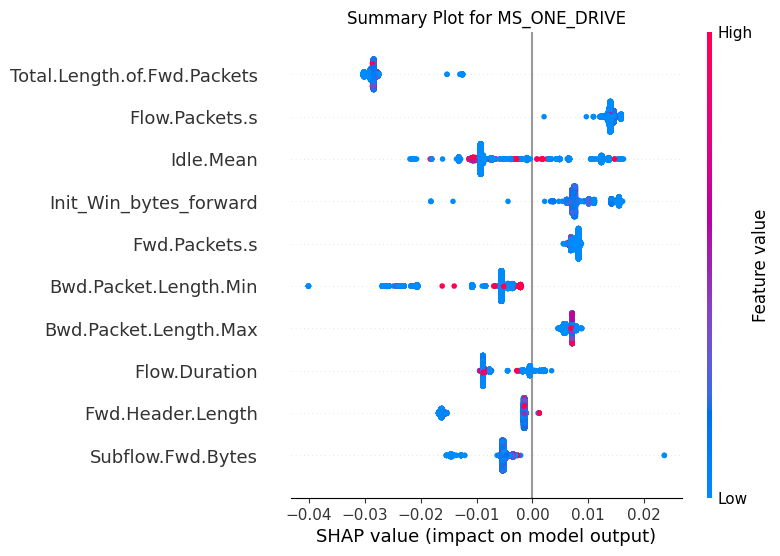

(5000, 67)
(5000, 67)


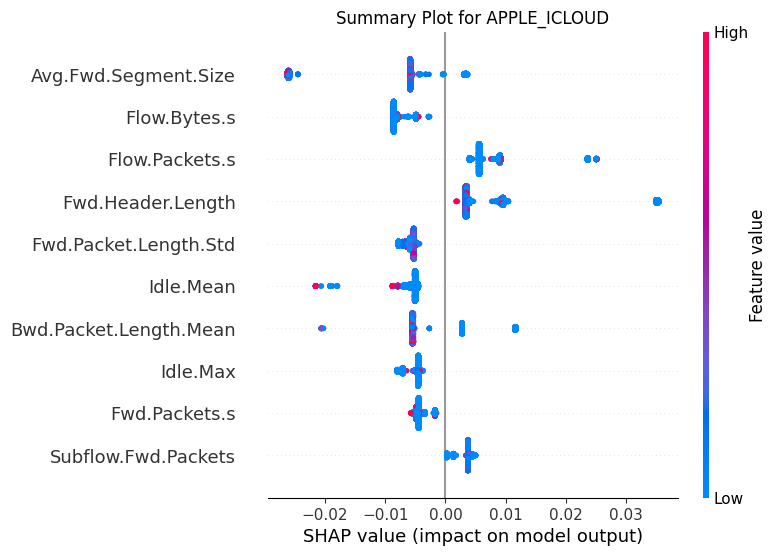

(5000, 67)
(5000, 67)


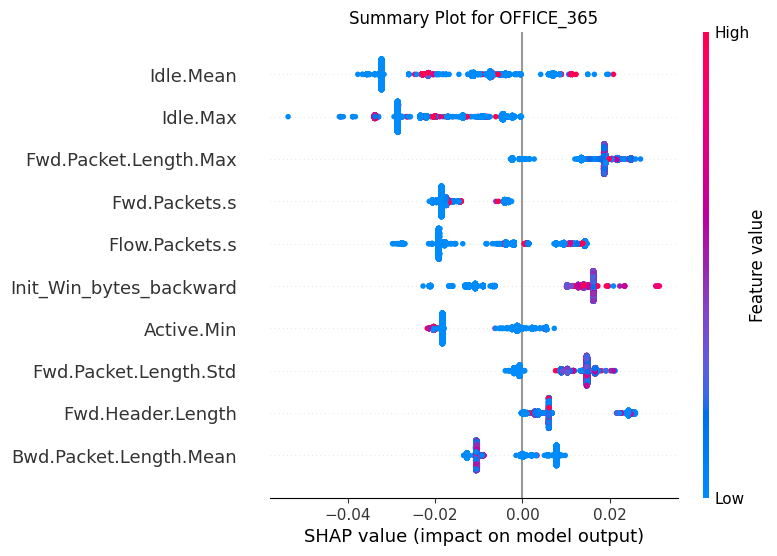

(5000, 67)
(5000, 67)


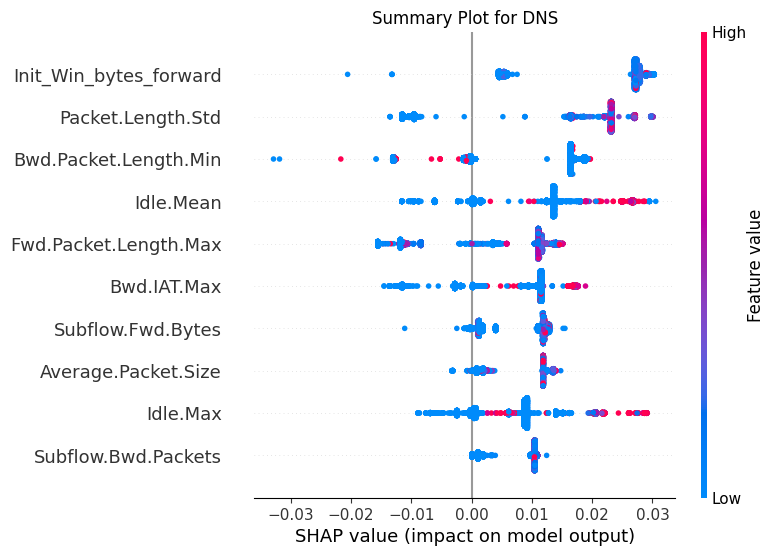

(5000, 67)
(5000, 67)


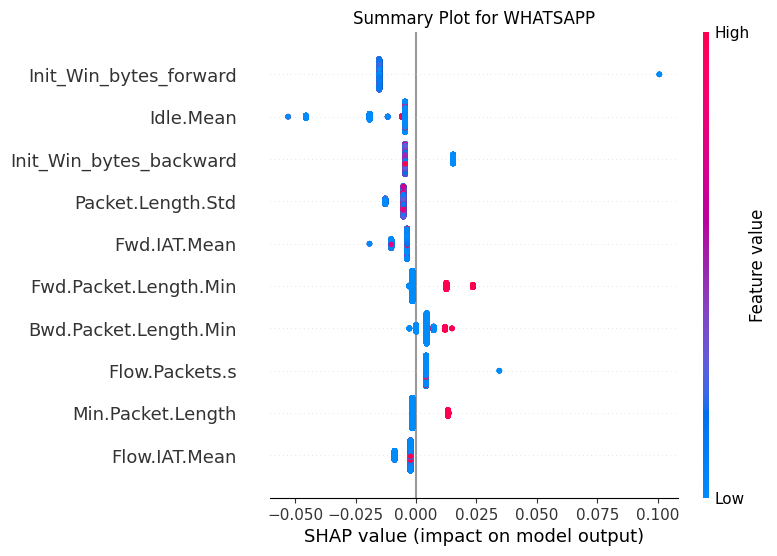

(5000, 67)
(5000, 67)


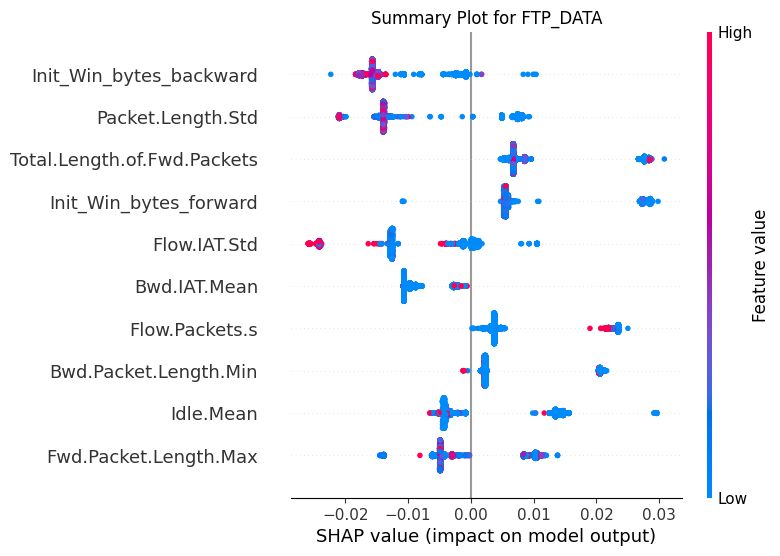

(5000, 67)
(5000, 67)


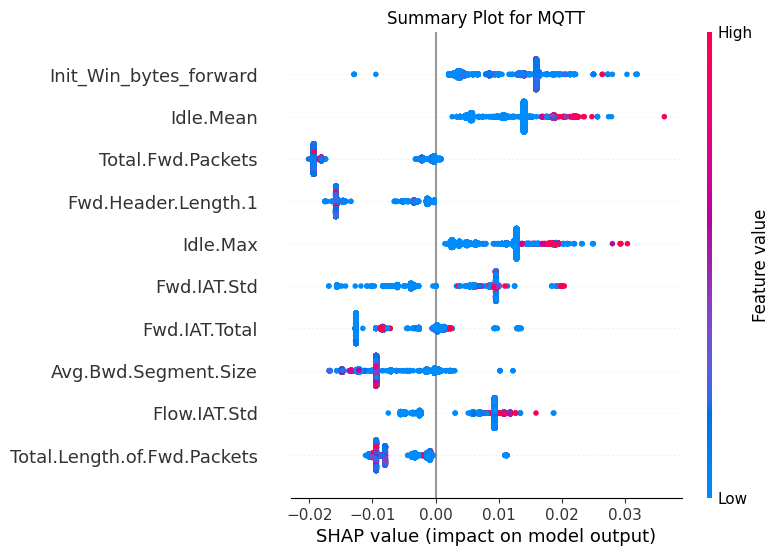

(5000, 67)
(5000, 67)


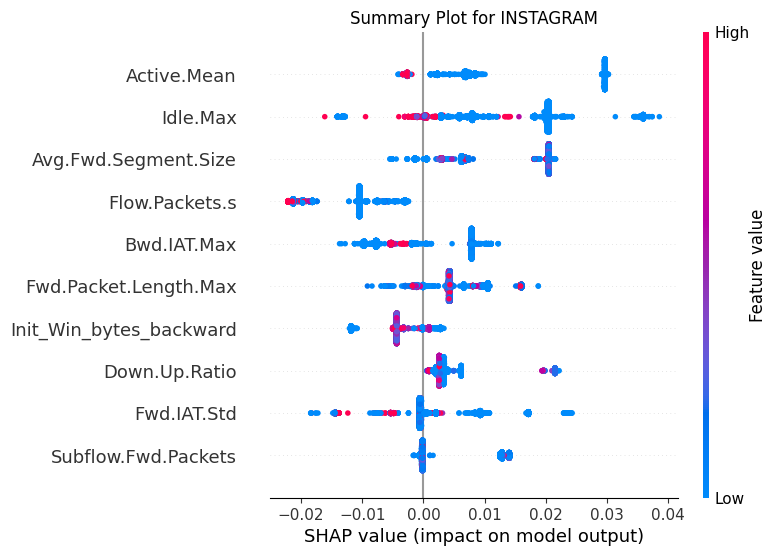

(5000, 67)
(5000, 67)


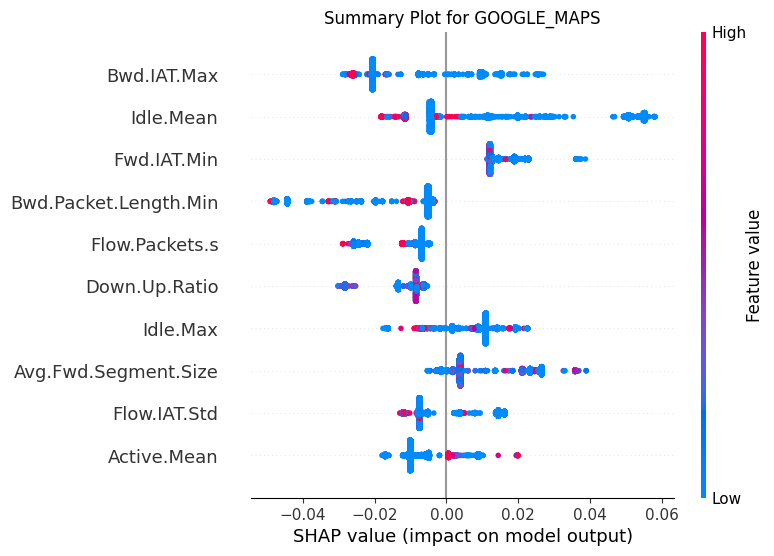

(5000, 67)
(5000, 67)


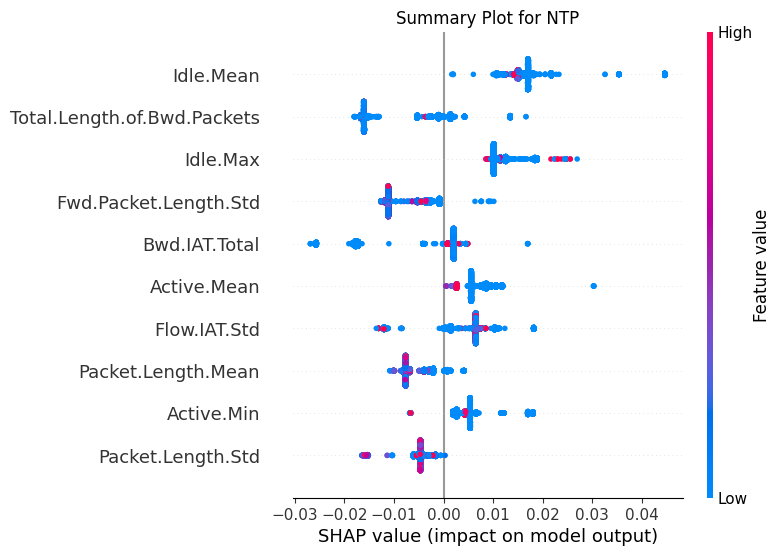

(5000, 67)
(5000, 67)


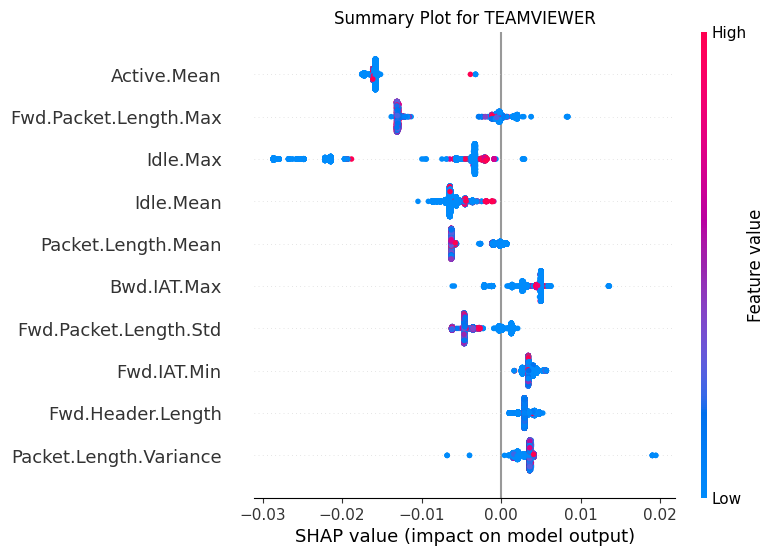

(5000, 67)
(5000, 67)


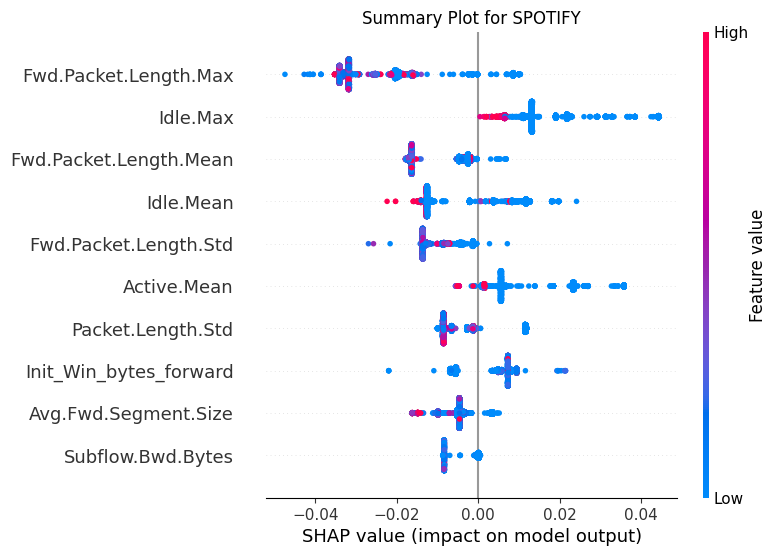

(5000, 67)
(5000, 67)


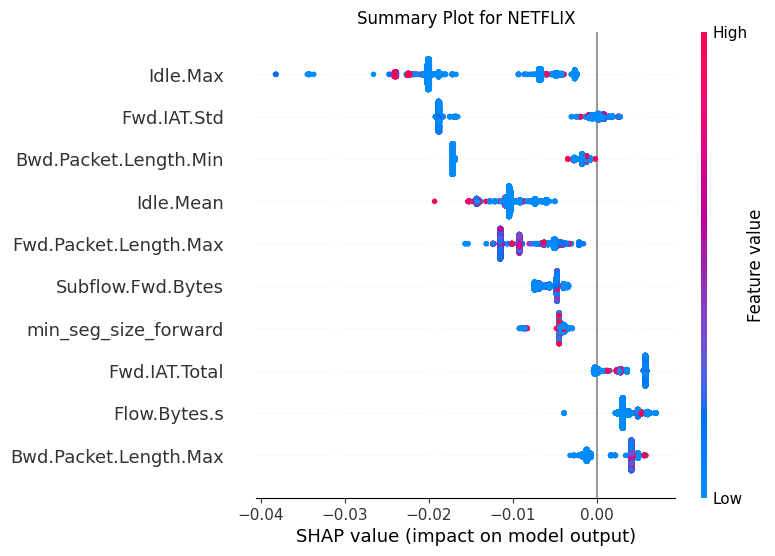

(5000, 67)
(5000, 67)


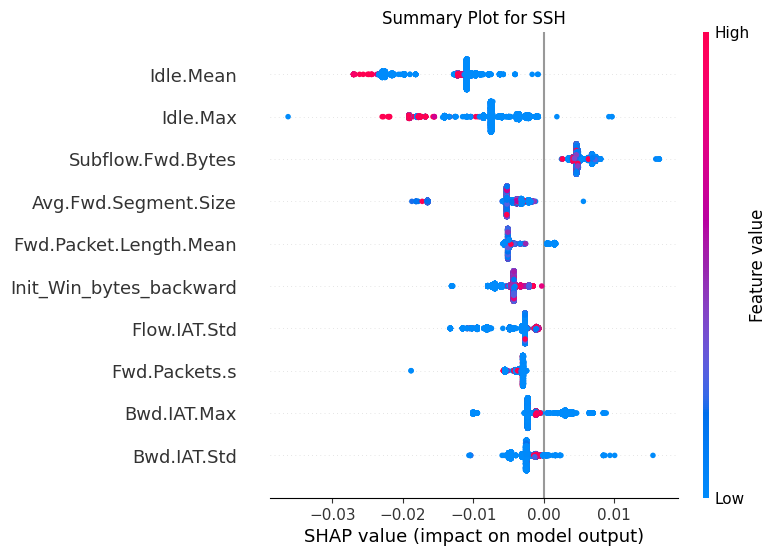

(5000, 67)
(5000, 67)


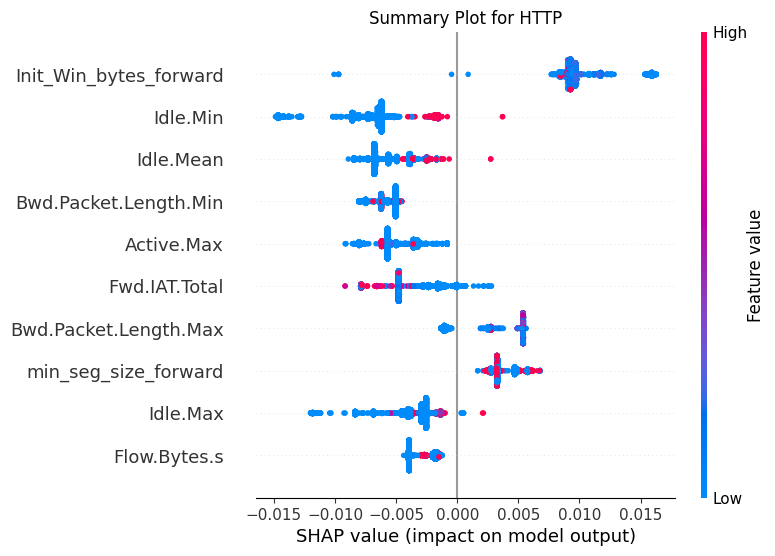

(5000, 67)
(5000, 67)


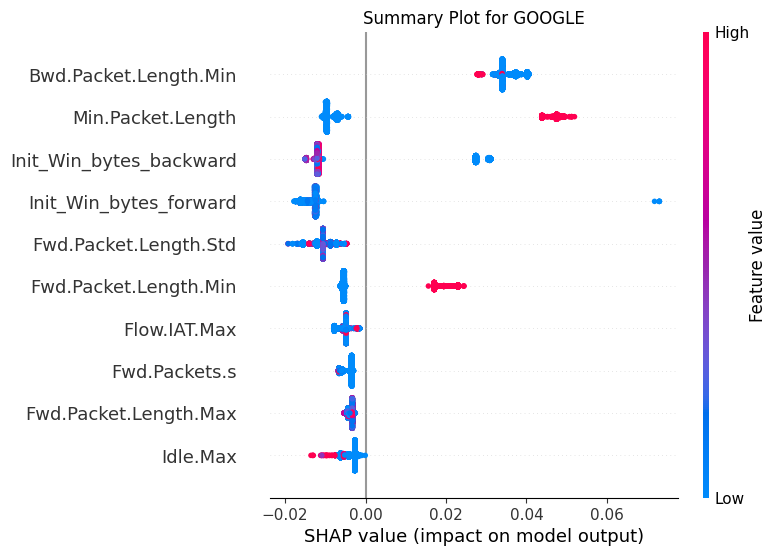

(5000, 67)
(5000, 67)


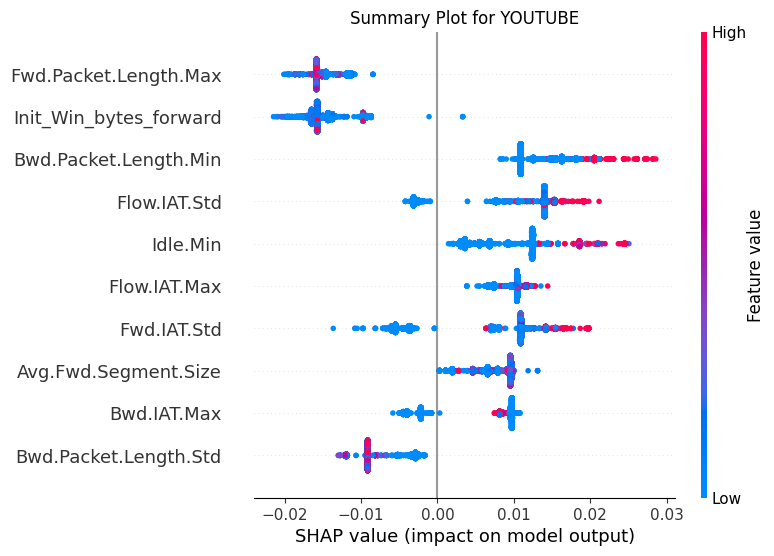

(5000, 67)
(5000, 67)


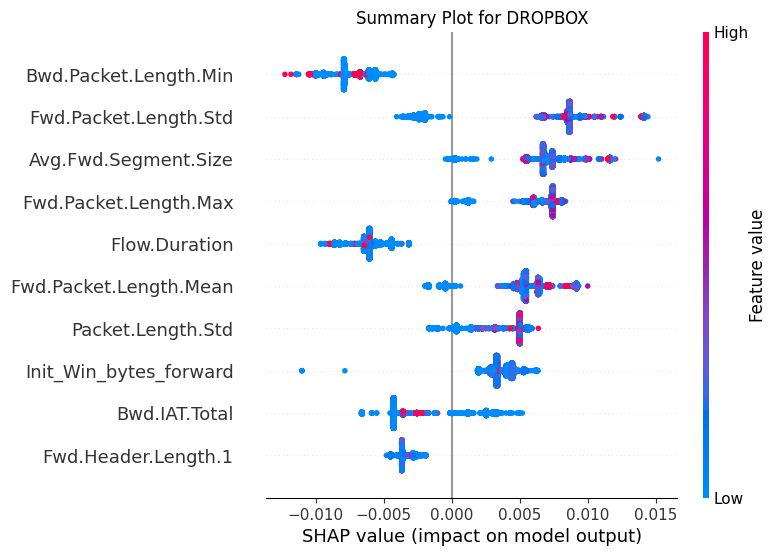

(5000, 67)
(5000, 67)


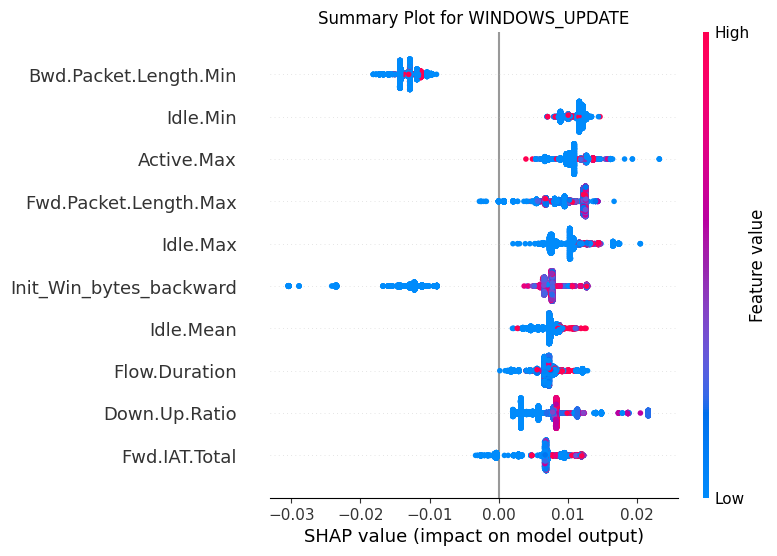

(5000, 67)
(5000, 67)


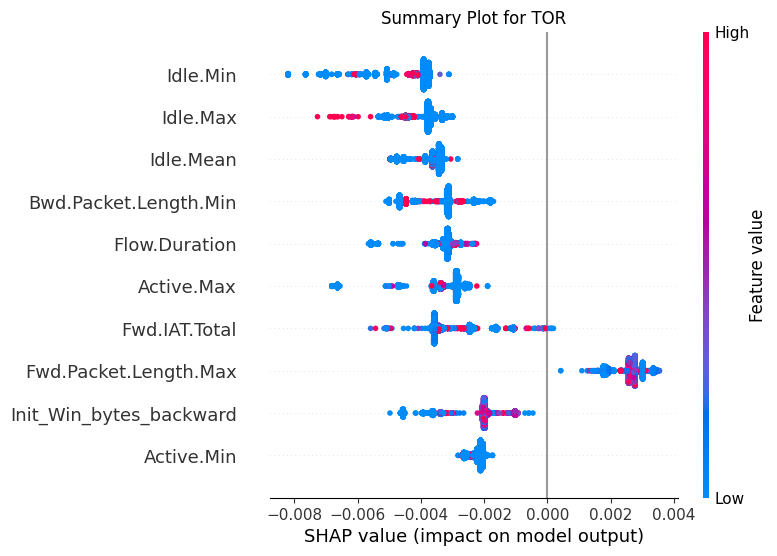

(5000, 67)
(5000, 67)


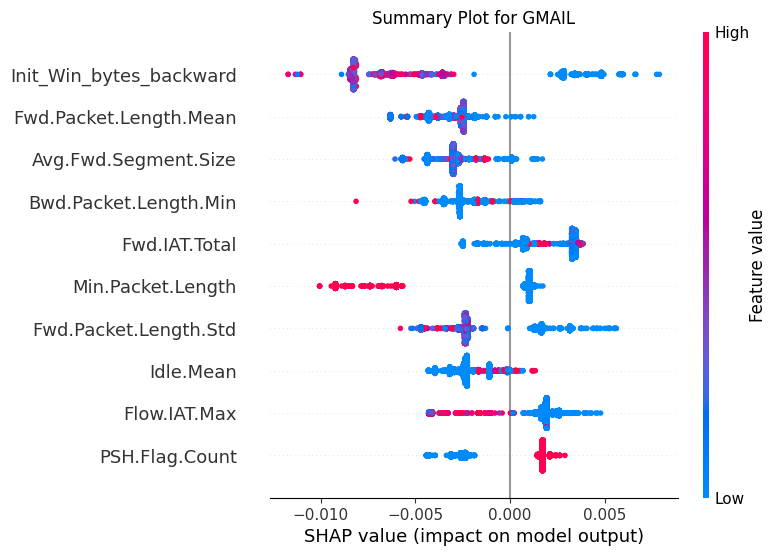

(5000, 67)
(5000, 67)


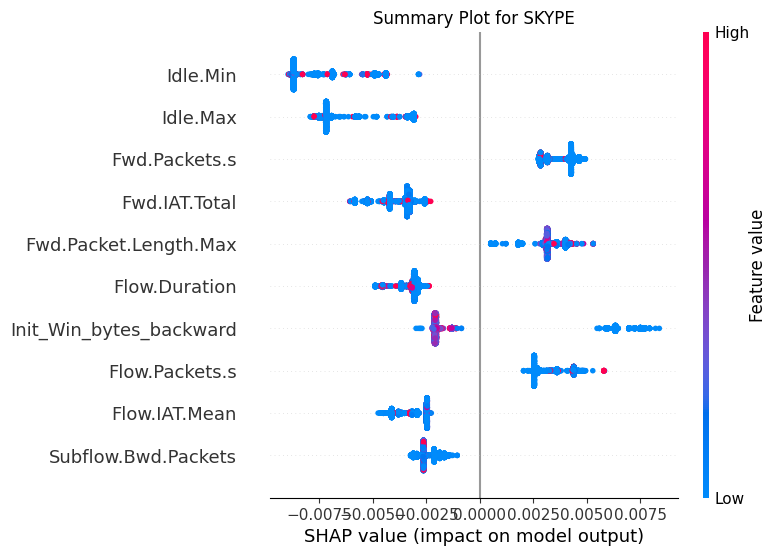

(5000, 67)
(5000, 67)


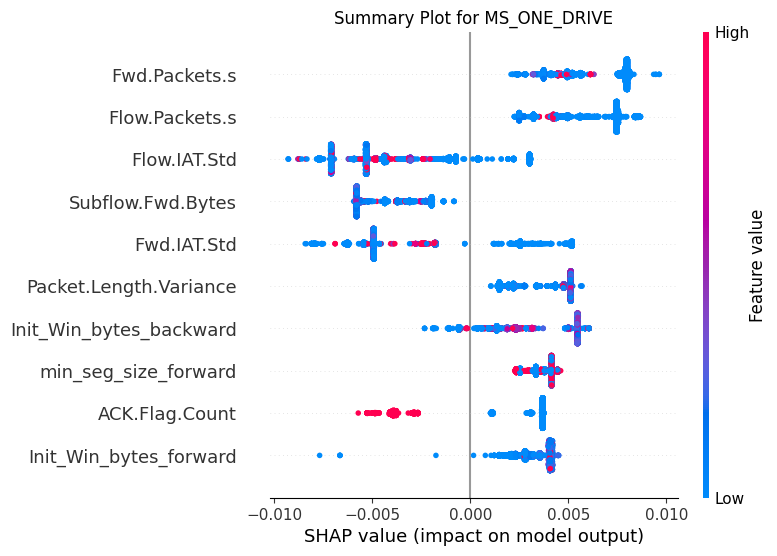

(5000, 67)
(5000, 67)


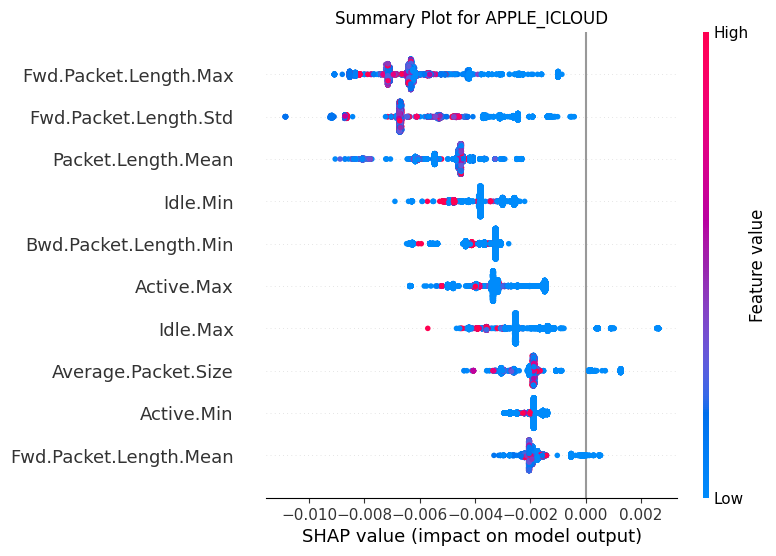

(5000, 67)
(5000, 67)


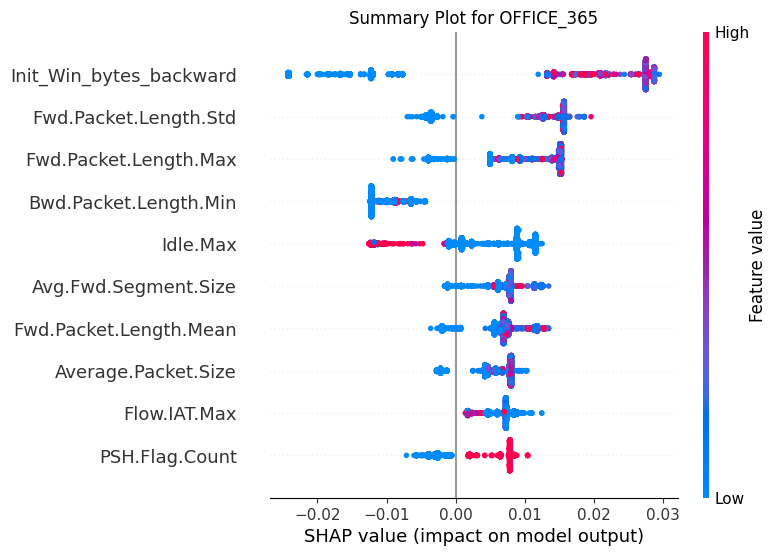

(5000, 67)
(5000, 67)


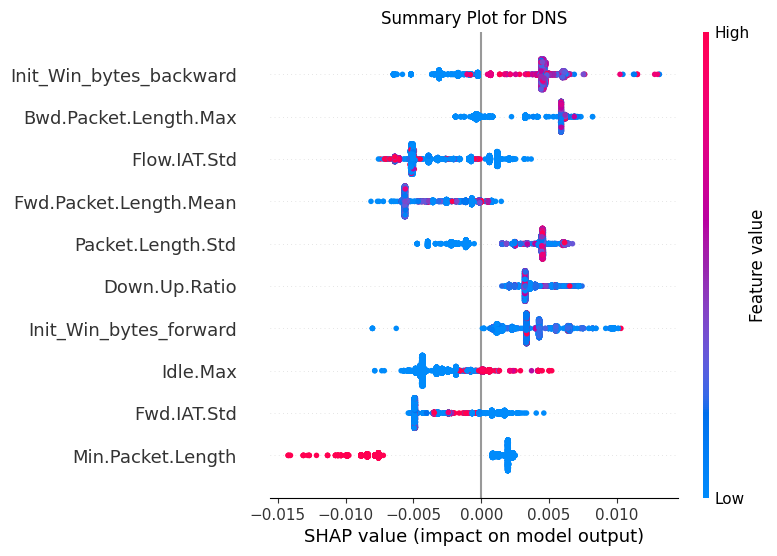

(5000, 67)
(5000, 67)


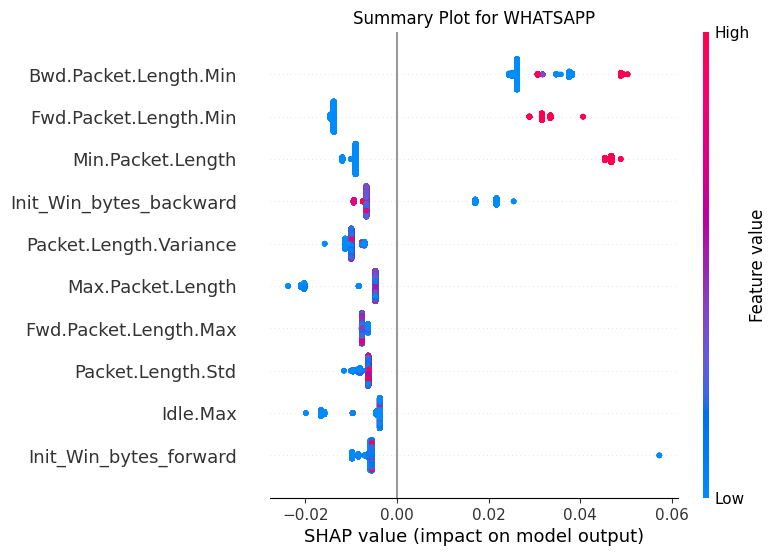

(5000, 67)
(5000, 67)


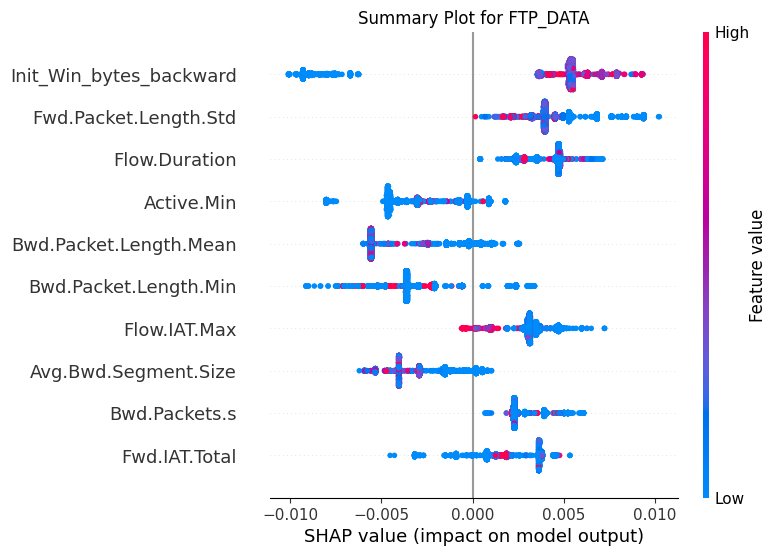

(5000, 67)
(5000, 67)


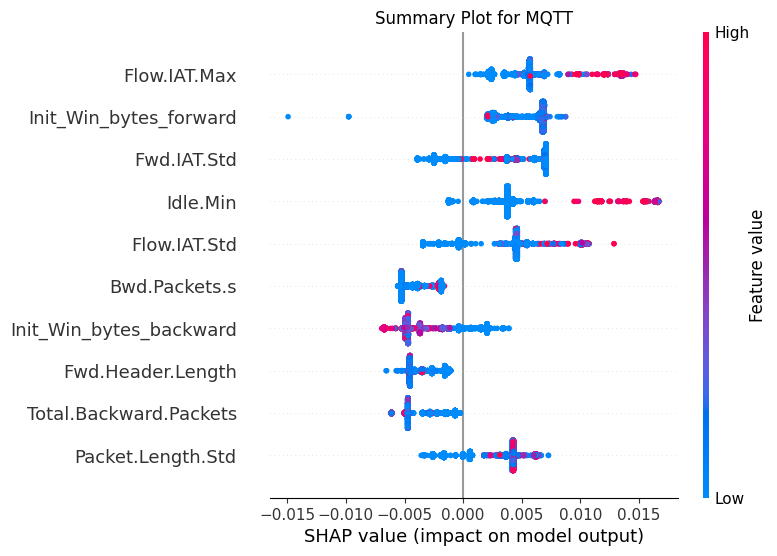

(5000, 67)
(5000, 67)


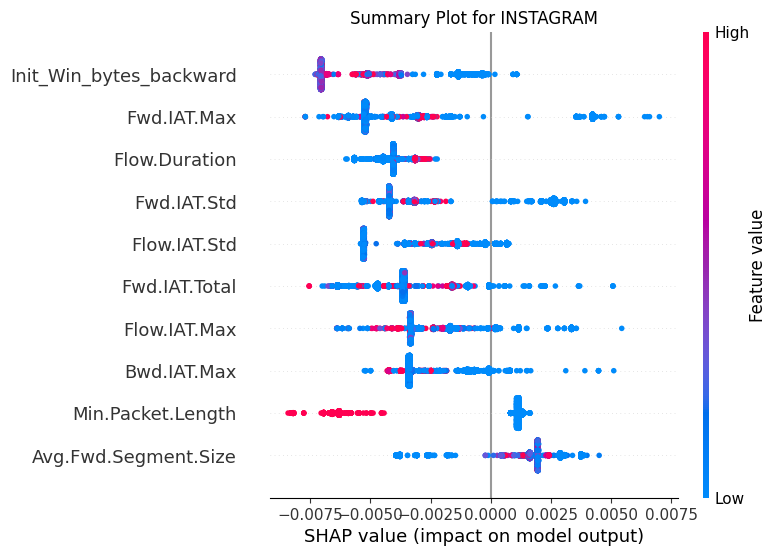

(5000, 67)
(5000, 67)


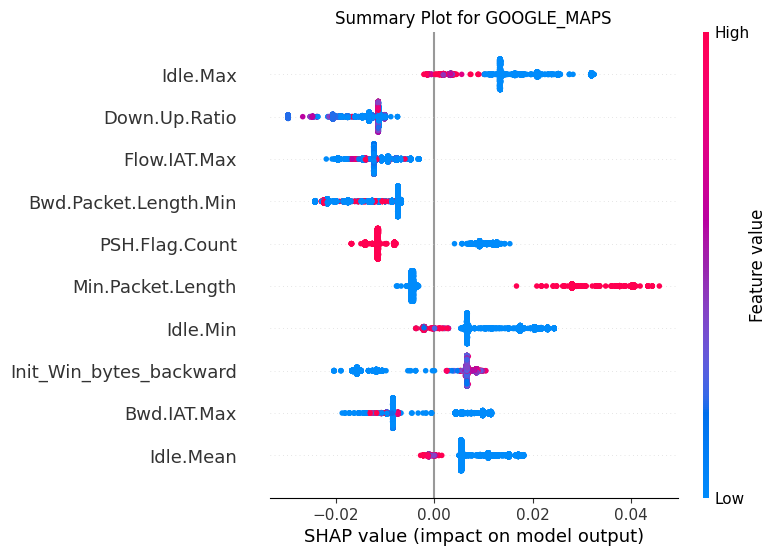

(5000, 67)
(5000, 67)


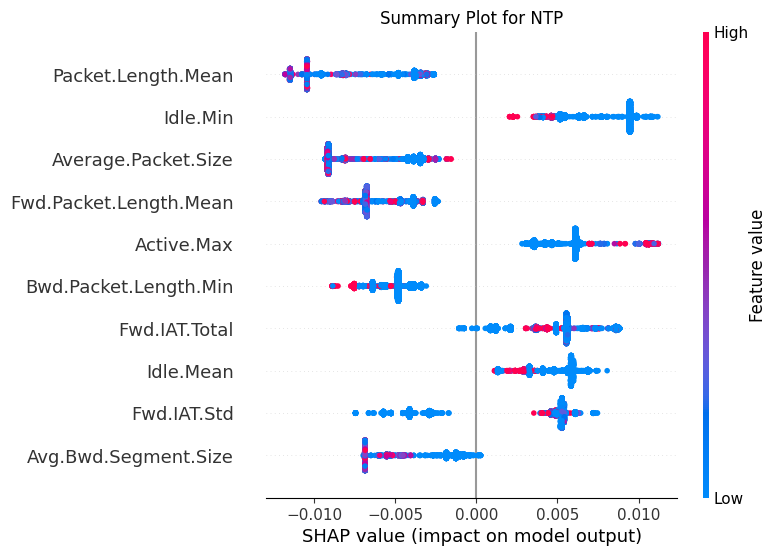

(5000, 67)
(5000, 67)


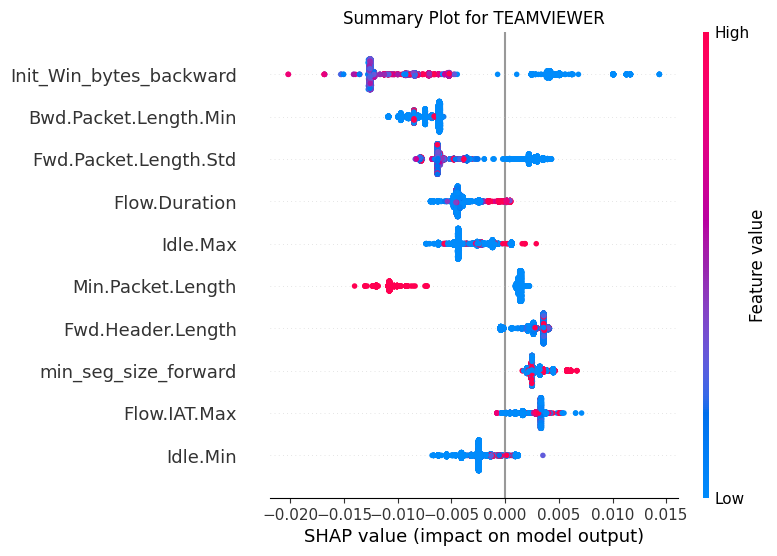

(5000, 67)
(5000, 67)


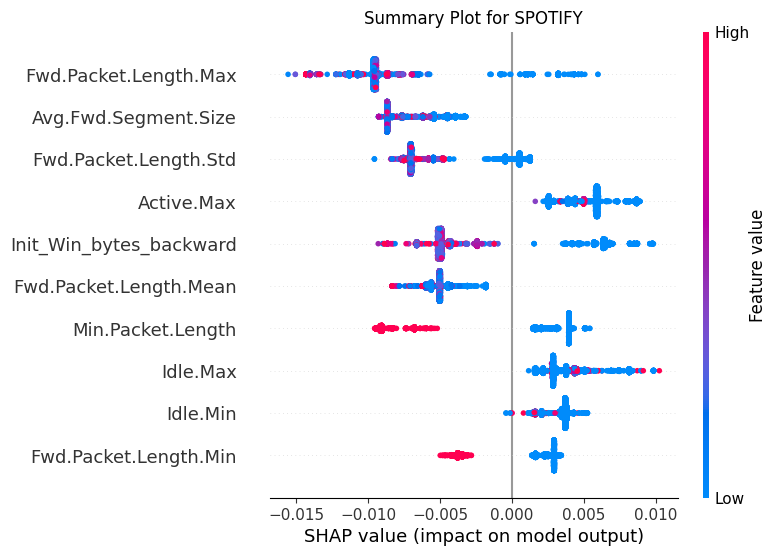

(5000, 67)
(5000, 67)


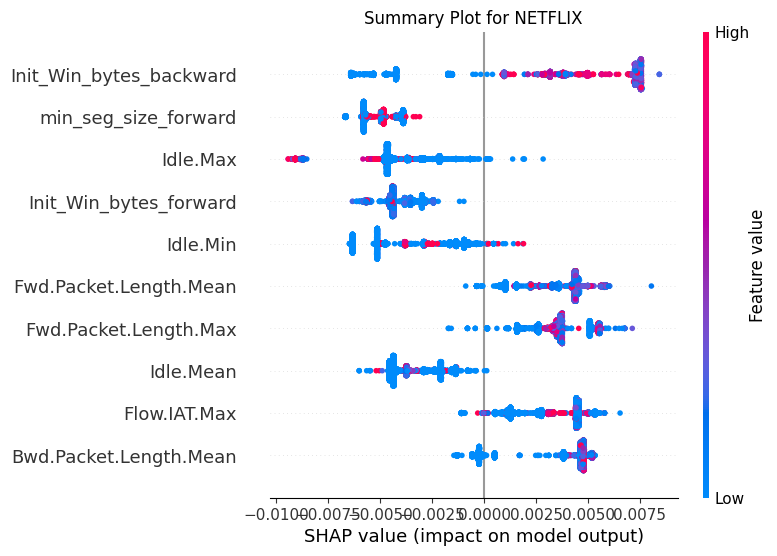

(5000, 67)
(5000, 67)


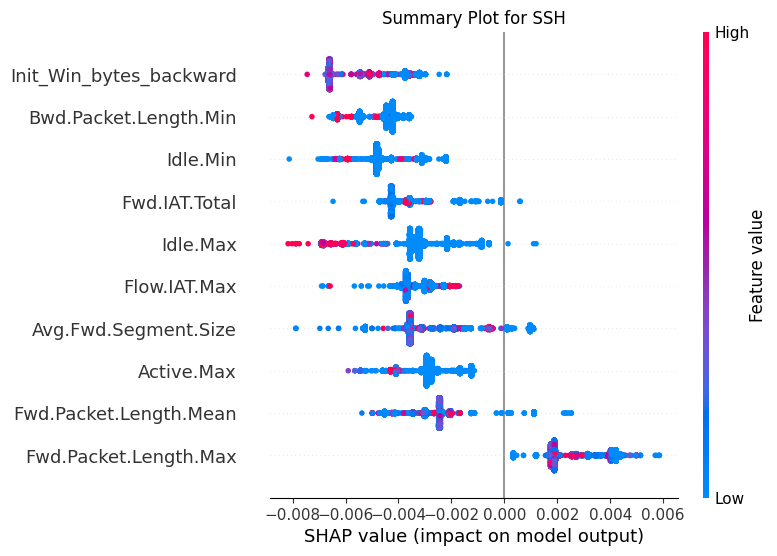

In [ ]:
# SUMMARY PLOTS FOR RF

for index, rf_shap_values in enumerate(rf_shap_values_list):
  # Load dataframe for the specific method
  rf_model, _, dataframe = load_models(methods[index])

  # Plot the overall summary plot (for all classes)
  shap.summary_plot(rf_shap_values, feature_names=list(dataframe.columns), show = False, max_display=10, class_names=rf_model.classes_)
  plt.title(f"Summary Plot for Method {methods[index]}")
  plt.gcf().set_size_inches(22,11)
  plt.savefig(xai_RF_folder + '/RF_'+methods[index]+'_Important_Features.png')
  plt.show()



# Plot SHAP's summary plot of each label
for index, rf_shap_values in enumerate(rf_shap_values_list):
  # Load dataframe for the specific method
  rf_model, _, dataframe = load_models(methods[index])

  dataframe = dataframe.drop('ProtocolName', axis=1)

  for a, app in enumerate(apps):

    shap.summary_plot(rf_shap_values[a], features=dataframe, feature_names=list(dataframe.columns),
                      show = False, max_display=10, class_names=rf_model.classes_)

    plt.title('Summary Plot for Method ' + str(methods[index]) + ' for App ' + str(app))
    plt.savefig(xai_RF_folder + '/RF_'+ methods[index] +'_' + app + '_Importan_Features.png')
    plt.show()

In [ ]:
# SUMMARY PLOTS FOR KNN

for index, knn_shap_values in enumerate(knn_shap_values_list):
  # Load dataframe for the specific method
  _, _, dataframe = load_models(methods[index])

  # Plot the overall summary plot (for all classes)
  shap.summary_plot(knn_shap_values, feature_names=list(dataframe.columns), show = False, max_display=10)
  plt.title(f"Summary Plot for Method {methods[index]}")
  plt.gcf().set_size_inches(22,11)
  plt.savefig(res_folder+'/XAI/KNN/KNN_'+methods[index]+'_Important_Features.png')
  plt.show()



shappoints = 5000

# Plot SHAP's summary plot of each label
for index, knn_shap_values in enumerate(knn_shap_values_list):
  # Load dataframe for the specific method
  _, _, dataframe = load_models(methods[index])

  dataframe = dataframe.drop('ProtocolName', axis=1)

  for a, app in enumerate(apps):

    shap.summary_plot(knn_shap_values[a], features=dataframe[:shappoints], feature_names=list(dataframe.columns),
                      show = False, max_display=10)

    plt.title('Summary Plot for ' + str(app))
    plt.savefig(res_folder+'/XAI/KNN/KNN_'+ methods[index] +'_' + app + '_Importan_Features.png')
    plt.show()



---



## **ZIP THE 'RESULTS' FOLDER**

In [ ]:
import shutil

# Path to the folder you want to download
folder_path = "/content/Results"

# Path to the ZIP file you want to create
zip_file_path = "/content/Results"

# Create the ZIP file
shutil.make_archive(zip_file_path, 'zip', folder_path)

'/content/Results.zip'